# Symulowane wyżarzanie

In [1]:
import typing
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from enum import Enum
import networkx as nx

## 1.1  TSP

### Wygeneruj chmurę n losowych punktów w 2D

In [2]:
class Point:
    def __init__(self, x:float, y:float)-> None:
        self.x = x
        self.y = y
    def get_x(self) -> float:
        return self.x
    def get_y(self) -> float:
        return self.y
    def get_point(self) -> (float, float):
        return (self.x, self.y)

In [3]:
def generate_random_points(number_of_points: int, left_corner: Point, right_corner: Point) -> [Point]:
    points = []
    for i in range(number_of_points):
        points.append(generate_random_point(left_corner, right_corner))
    return points

In [4]:
def generate_random_point(left_corner: Point, right_corner: Point) -> Point:
    return Point(np.random.uniform(min(left_corner.x, right_corner.x), max(left_corner.x, right_corner.x)),
                 np.random.uniform(min(left_corner.y, right_corner.y), max(left_corner.y, right_corner.y)))

In [5]:
def generate_2d_normal_distribution_points(number_of_points: int, mean: [float], cov: [float]) -> [Point]:
    points = []
    tab = np.random.multivariate_normal(mean, cov, number_of_points)
    
    for point in tab:
        points.append(Point(point[0], point[1]))
    return points

In [6]:
def generate_9_seperated_groups_of_points(number_of_points: int) -> [Point]:
    x = number_of_points // 9
    rest = number_of_points - 9*x
    step = 100
    size = 20
    
    points = []
    for i in range(8):
        a = i % 3
        b = i // 3
        l_c = Point(2 * step * a, 2 * step * b)
        r_c = Point(2 * step * a + size, 2 * step * b + size)
        for point in generate_random_points(x, l_c, r_c):
            points.append(point)
            
    l_c = Point(4 * step, 4 * step)
    r_c = Point(4 * step + size, 4 * step + size)
    for point in generate_random_points(x+rest, l_c, r_c):
            points.append(point)
    return points

In [7]:
def distance_between_points(point1: Point, point2: Point) -> float:
    return np.linalg.norm((point1.x - point2.x, point1.y - point2.y))

### Zastosuj algorytm symulowanego wyżarzania do przybliżonego rozwiązania problemu komiwojażera dla tych punktów.

In [8]:
class Temperature:
    def __init__(self, linear_T0, linear_q, exponential_T0, exponential_q):
        self.linear_T0 = linear_T0
        self.linear_q = linear_q
        self.exponential_T0 = exponential_T0
        self.exponential_q = exponential_q
        
    def linear(self, i):
        return max(10**(-18), self.linear_T0 - self.linear_q * i)
        
    def exponential(self, i):
        return self.exponential_T0 * pow(self.exponential_q, i)

In [9]:
class Annealing_TSP:
    def __init__(self, points: [Point]) -> None:
        self.points       = points
        self.n            = len(points)
        self.start_state  = self.random_state()
        self.start_result = self.get_total_distance(self.start_state)
        self.temperature  = None
        self.swap_type    = None
        self.best_state   = None
        self.best_result  = None
        self.curr_state   = None
        self.curr_result  = None
        self.all_states   = []
    
    def reset_data(self):
        self.best_state, self.curr_state = (self.start_state).copy(), (self.start_state).copy()
        self.best_result, self.curr_result = self.start_result, self.start_result
    
    def random_state(self) -> [int]:
        state = np.arange(self.n)
        np.random.shuffle(state)
        return state
    
    def get_total_distance(self, state: [int]) -> float:
        total_distance = 0
        for i in range(self.n - 1):
            total_distance += distance_between_points(
                self.points[state[i]], 
                self.points[state[i+1]])
        total_distance += distance_between_points(
            self.points[state[0]],
            self.points[state[self.n - 1]])
        return total_distance
    
    def swap(self, i: int) -> None:
        state = self.curr_state.copy()

        idx1, idx2 = self.swap_type()
        state[idx1], state[idx2] = state[idx2], state[idx1]
        new_result = self.get_total_distance(state)

        if new_result < self.curr_result:
            self.curr_state = state
            self.curr_result = new_result
            return

        probability = np.exp((self.curr_result - new_result) / self.temperature(i))
 
        if np.random.choice([1,0], p=[probability, 1 - probability]):
            self.curr_state = state
            self.curr_result = new_result
    
    def arbitrary_swap(self) -> (int, int):
        return np.random.randint(self.n), np.random.randint(self.n)
    
    def consecutive_swap(self) -> (int, int):
        idx1 = np.random.randint(self.n)
        idx2 = idx1 + 1 if np.random.choice([0,1]) else idx1 - 1
        idx2 %= self.n
        
        return idx1, idx2
        
    def reset(self) -> None:
        self.curr_result = self.best_result
        self.curr_state = self.best_state
    
    def update_best(self) -> None:
        if self.best_result > self.curr_result:
            self.best_result = self.curr_result
            self.best_state = self.curr_state 
            self.all_states.append(self.best_state)
    
    def solve(self, temperature, steps, swap_type=0, reset=False, visualization=False) -> None:
        self.temperature = temperature
        if swap_type == 0:
            self.swap_type = self.arbitrary_swap
        elif swap_type == 1:
            self.swap_type = self.consecutive_swap
        
        self.reset_data()
        xs = [i for i in range(1, steps)]
        cost_ys = []
        temp_ys = []

        for i in range(1, steps):
            if reset and i % (steps//10) == 0:
                self.reset()
            cost_ys.append(self.curr_result)  
            temp_ys.append(self.temperature(i))
            self.swap(i)
            self.update_best()
            
        return xs, temp_ys, cost_ys, self.best_result, self.best_state, self.all_states

### a) Przedstaw wizualizację otrzymanego rozwiązania dla 3 różnych wartości n oraz 3 różnych układów punktów w 2D (rozkład jednostajny, rozkład normalny z czterema różnymi grupami parametrów, dziewięć odseparowanych grup punktów).

In [10]:
def show_state(points, state):
    plt.rcParams["figure.figsize"] = [7, 7]
    G = nx.Graph()
    for count, point in enumerate(points):
        G.add_node(count, pos=(point.get_x(), point.get_y()))
    for i in range(len(points) - 1):
        G.add_edge(state[i], state[i+1])
    G.add_edge(state[0], state[-1])
    pos=nx.get_node_attributes(G,'pos')
    return G, pos

### rozkład jednostajny n = 10

<IPython.core.display.Javascript object>


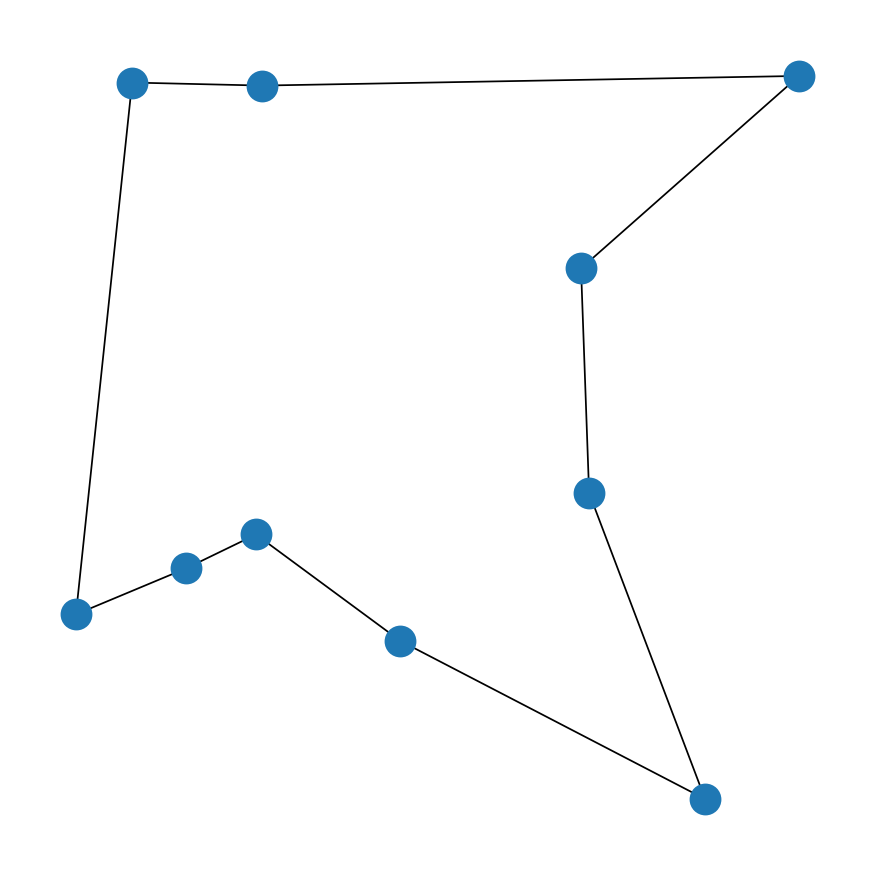

In [131]:
%matplotlib notebook
points_uniform_10 = generate_random_points(10, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_uniform_10)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=10000)
G, pos = show_state(points_uniform_10, best_state)
nx.draw(G, pos)

### rozkład jednostajny n = 50

<IPython.core.display.Javascript object>


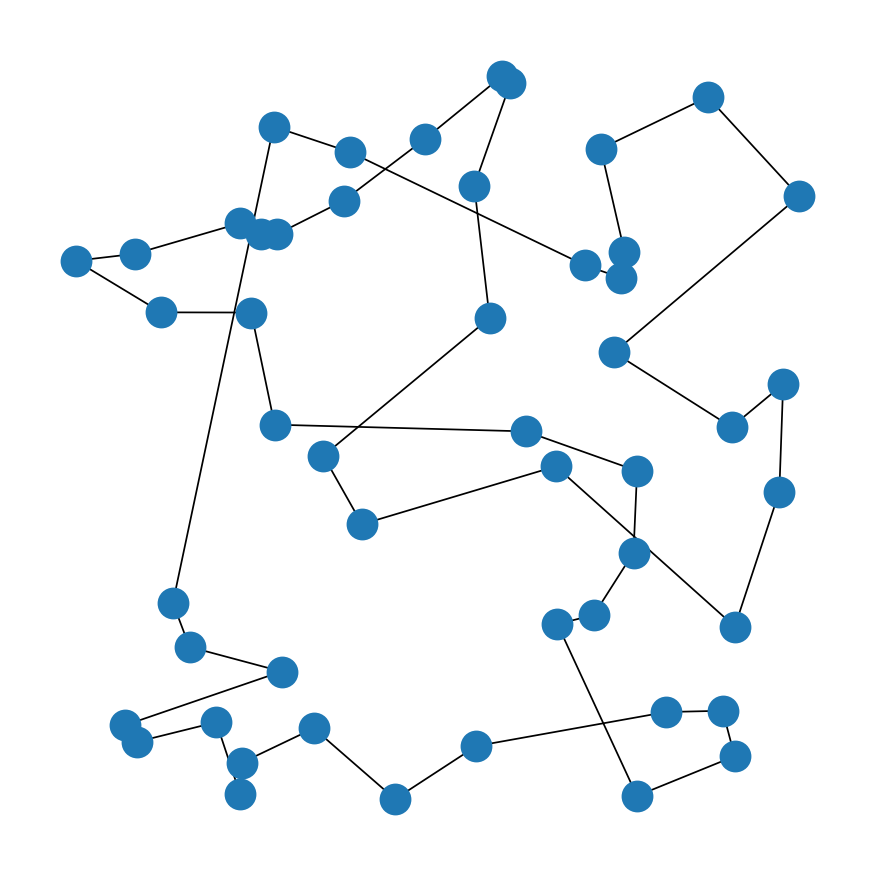

In [132]:
%matplotlib notebook
points_uniform_50 = generate_random_points(50, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_uniform_50)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=10000)
G, pos = show_state(points_uniform_50, best_state)
nx.draw(G, pos)

### rozkład jednostajny n = 100

<IPython.core.display.Javascript object>


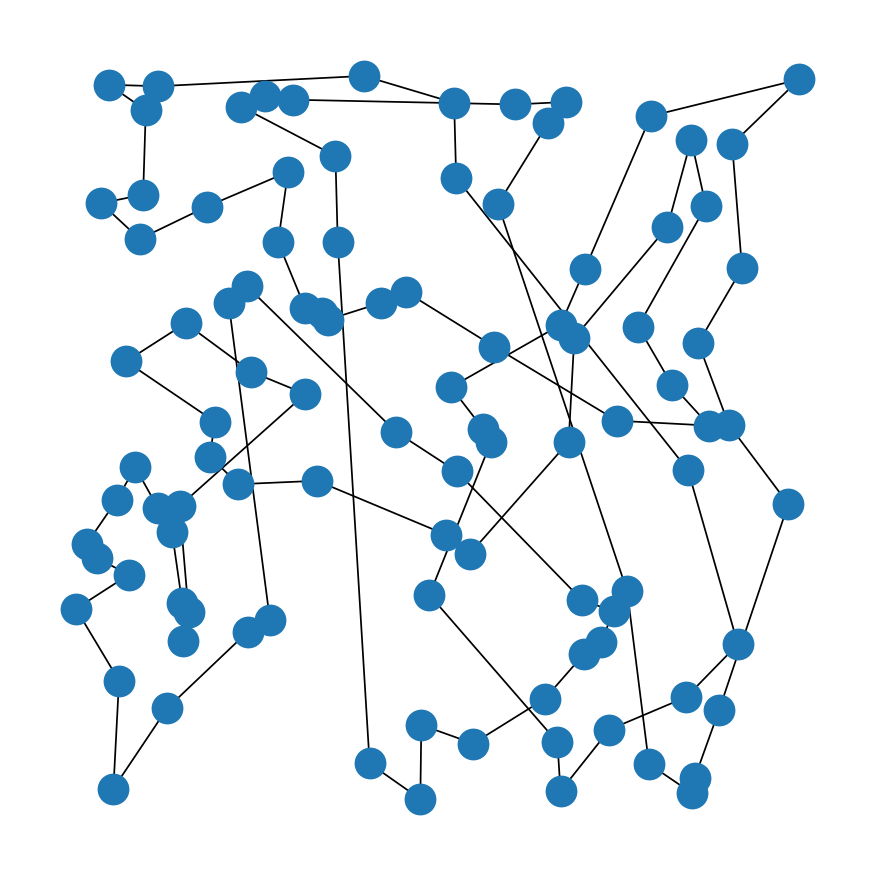

In [18]:
%matplotlib notebook
points_uniform_100 = generate_random_points(100, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_uniform_100)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_uniform_100, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [0,0], cov = [[1,0], [0,1]], n = 10

In [19]:
mean_a = [0,0]
cov_a = [[1, 0], 
       [0, 1]]

<IPython.core.display.Javascript object>


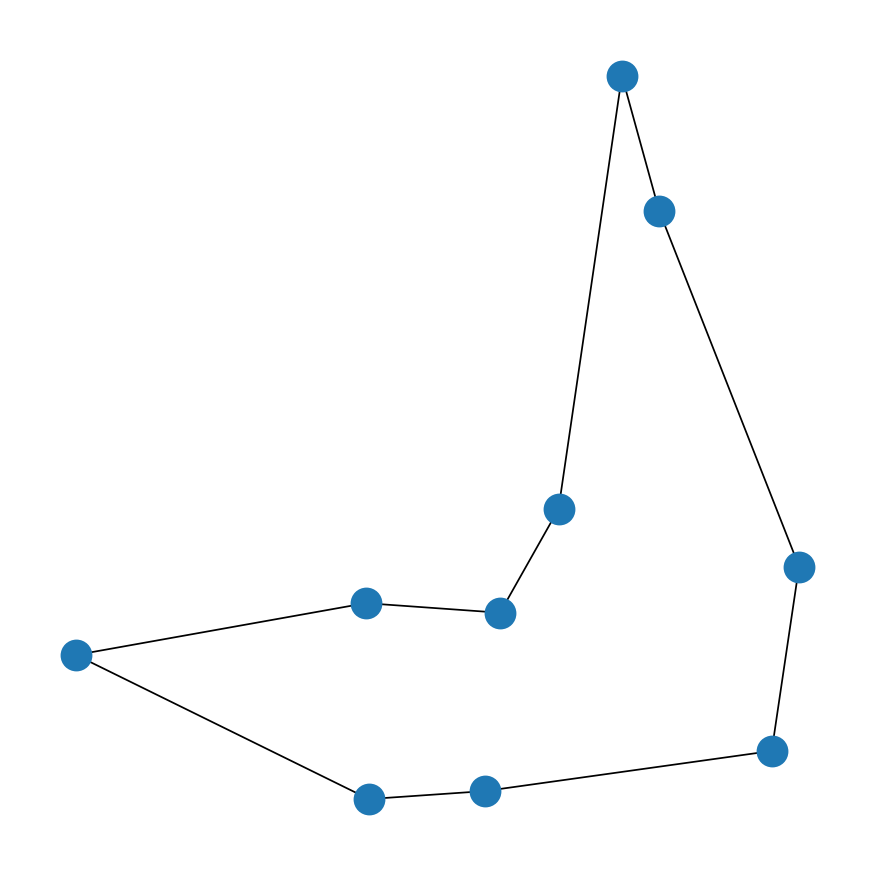

In [20]:
%matplotlib notebook
points_normal_10_a = generate_2d_normal_distribution_points(10, mean_a, cov_a)
TSP = Annealing_TSP(points_normal_10_a)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=10000)
G, pos = show_state(points_normal_10_a, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [0,0], cov = [[1,0], [0,1]], n = 50

<IPython.core.display.Javascript object>


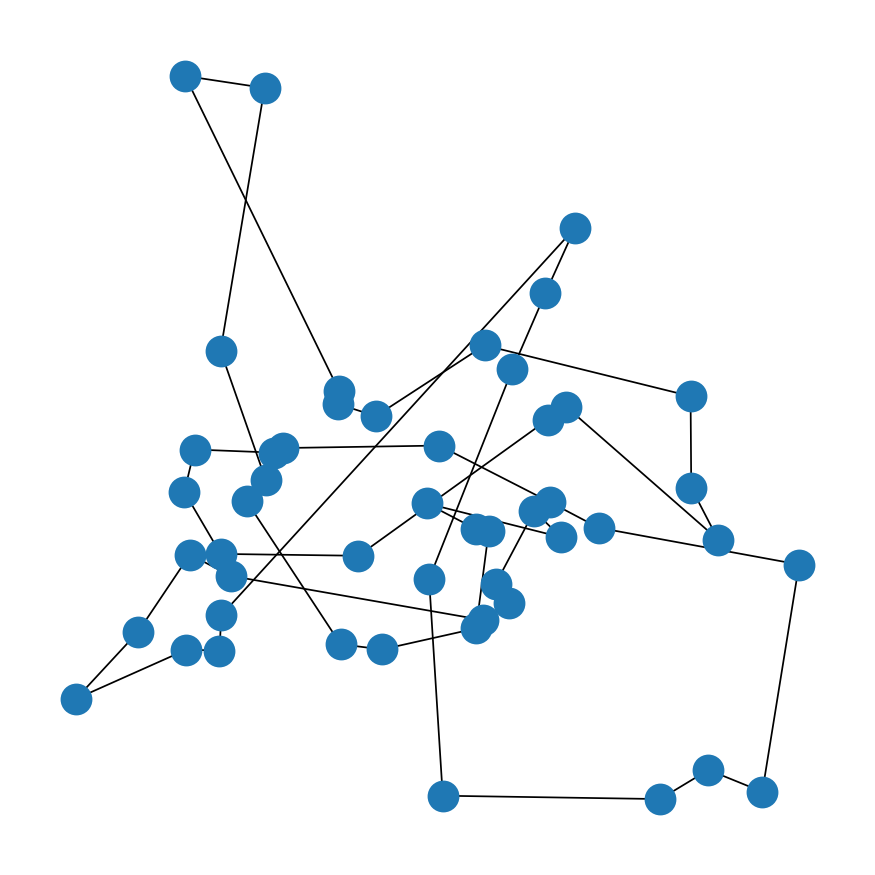

In [21]:
%matplotlib notebook
points_normal_50_a = generate_2d_normal_distribution_points(50, mean_a, cov_a)
TSP = Annealing_TSP(points_normal_50_a)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=10000)
G, pos = show_state(points_normal_50_a, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [0,0], cov = [[1,0], [0,1]], n = 100

<IPython.core.display.Javascript object>


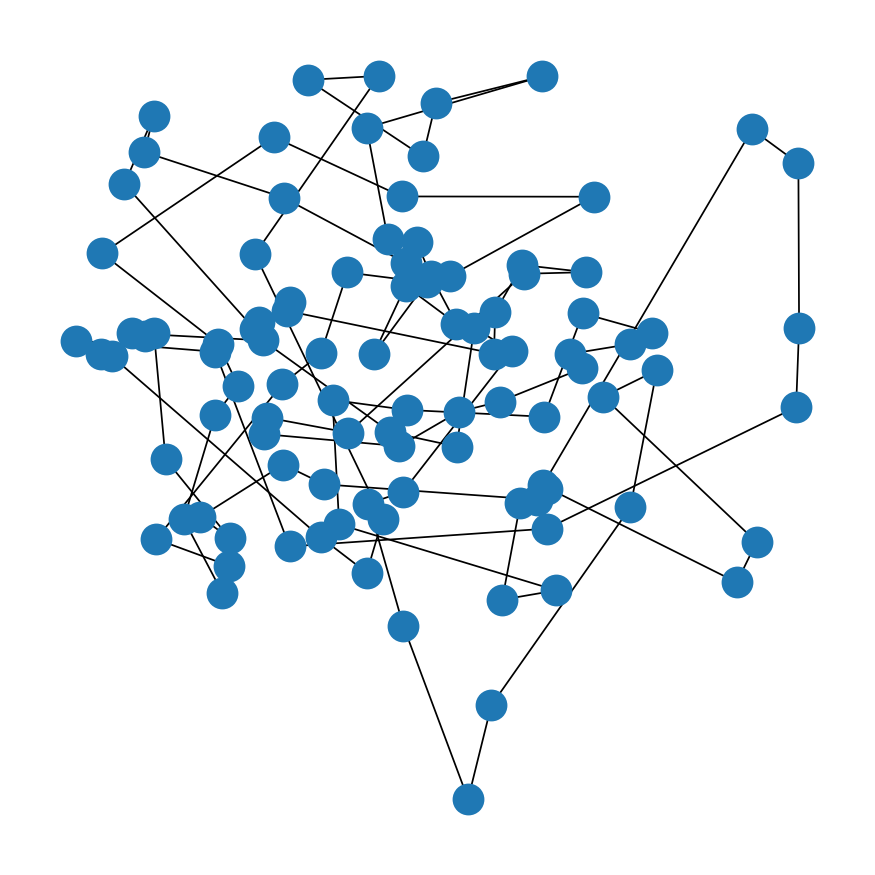

In [22]:
%matplotlib notebook
points_normal_100_a = generate_2d_normal_distribution_points(100, mean_a, cov_a)
TSP = Annealing_TSP(points_normal_100_a)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=10000)
G, pos = show_state(points_normal_100_a, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [0,0], cov = [[3,0], [0,3]], n = 50

In [23]:
mean_b = [0,0]
cov_b = [[3, 0], 
       [0, 3]]

<IPython.core.display.Javascript object>


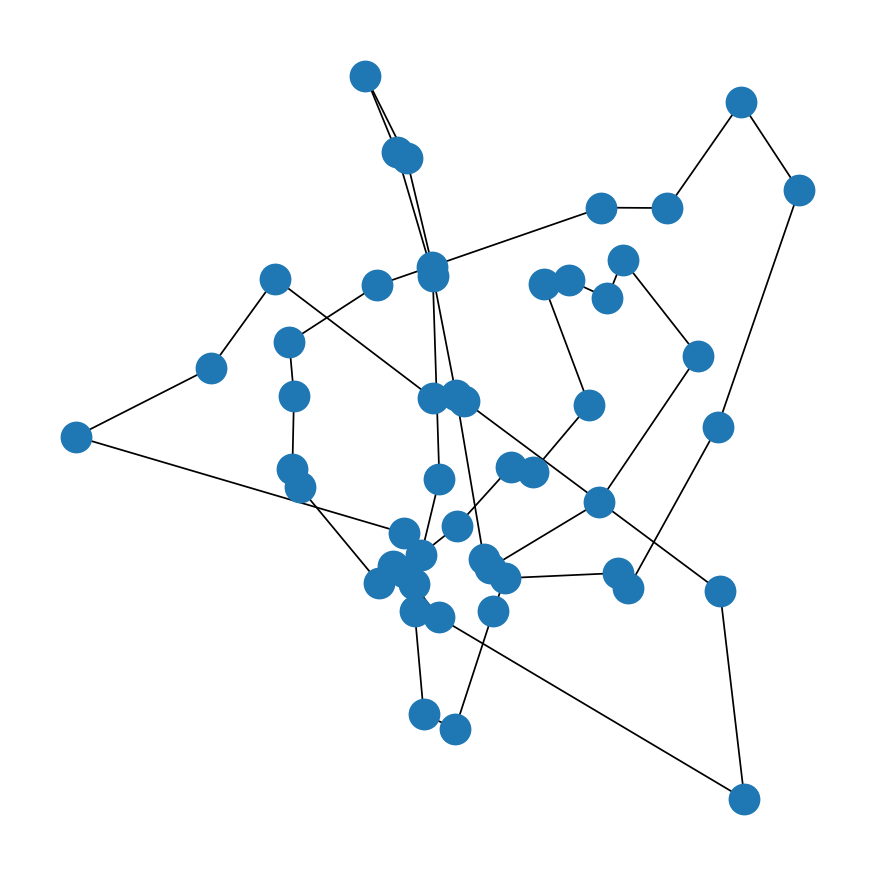

In [24]:
%matplotlib notebook
points_normal_50_b = generate_2d_normal_distribution_points(50, mean_b, cov_b)
TSP = Annealing_TSP(points_normal_50_b)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=20000)
G, pos = show_state(points_normal_50_b, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [0,0], cov = [[10,0], [0,10]], n = 50

In [25]:
mean_c = [0,0]
cov_c = [[10, 0], 
       [0, 10]]

<IPython.core.display.Javascript object>


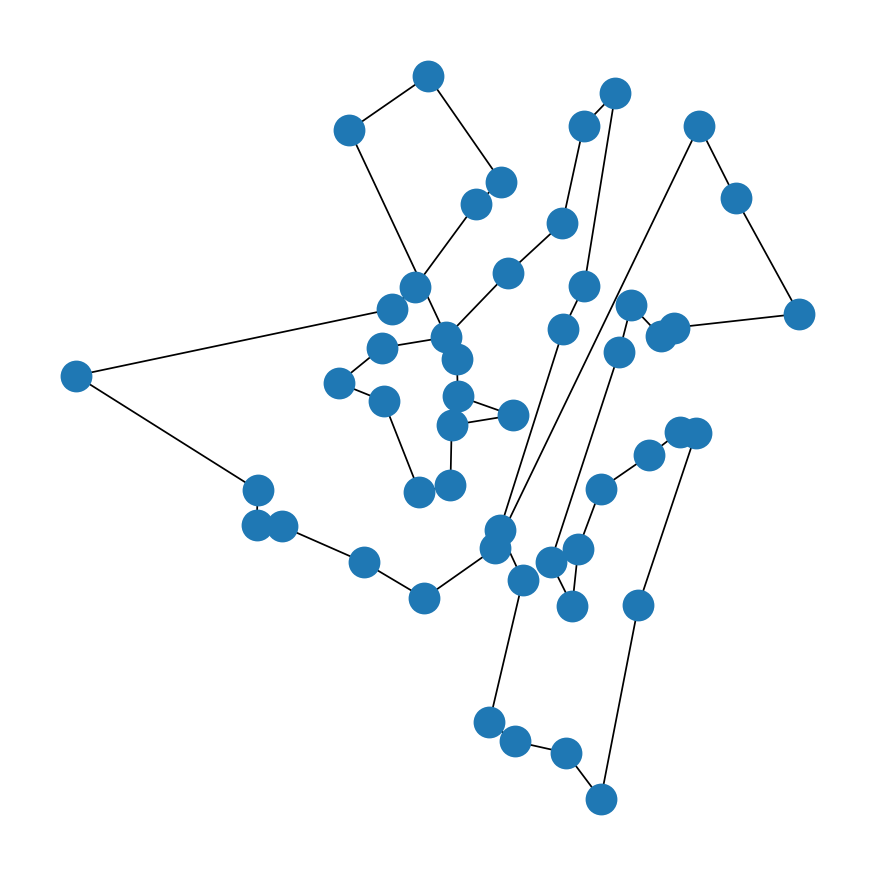

In [26]:
%matplotlib notebook
points_normal_50_c = generate_2d_normal_distribution_points(50, mean_c, cov_c)
TSP = Annealing_TSP(points_normal_50_c)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_normal_50_c, best_state)
nx.draw(G, pos)

### rozkład normalny mean = [10,0], cov = [[20,2], [2,20]], n = 50

In [27]:
mean_d = [10,0]
cov_d = [[20, 2], 
       [2, 20]]

<IPython.core.display.Javascript object>


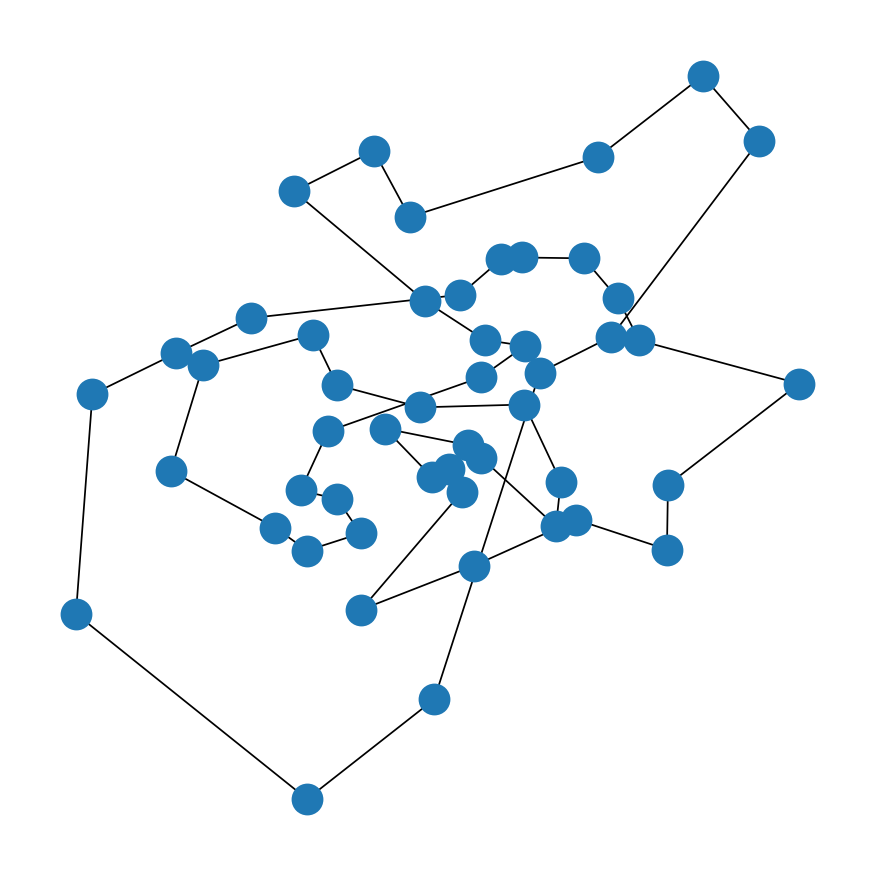

In [28]:
%matplotlib notebook
points_normal_50_d = generate_2d_normal_distribution_points(50, mean_d, cov_d)
TSP = Annealing_TSP(points_normal_50_d)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_normal_50_d, best_state)
nx.draw(G, pos)

### 9 odseparowanych grup punktów, n = 10

<IPython.core.display.Javascript object>


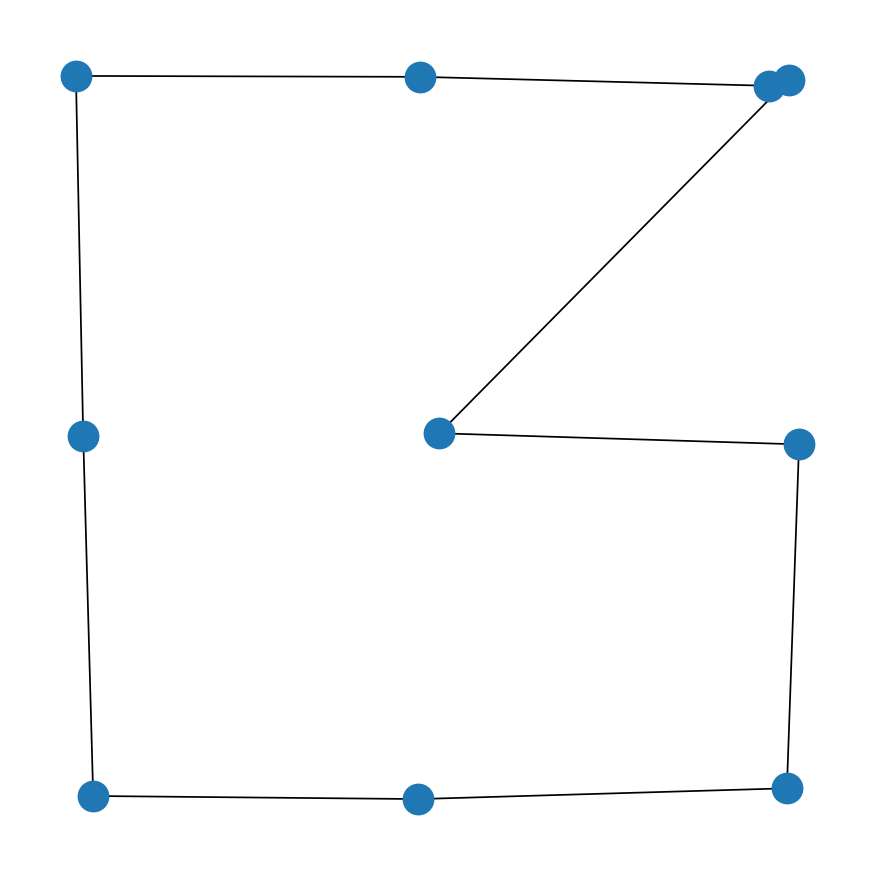

In [29]:
%matplotlib notebook
points_9_groups_10 = generate_9_seperated_groups_of_points(10)
TSP = Annealing_TSP(points_9_groups_10)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_9_groups_10, best_state)
nx.draw(G, pos)

### 9 odseparowanych grup punktów, n = 50

<IPython.core.display.Javascript object>


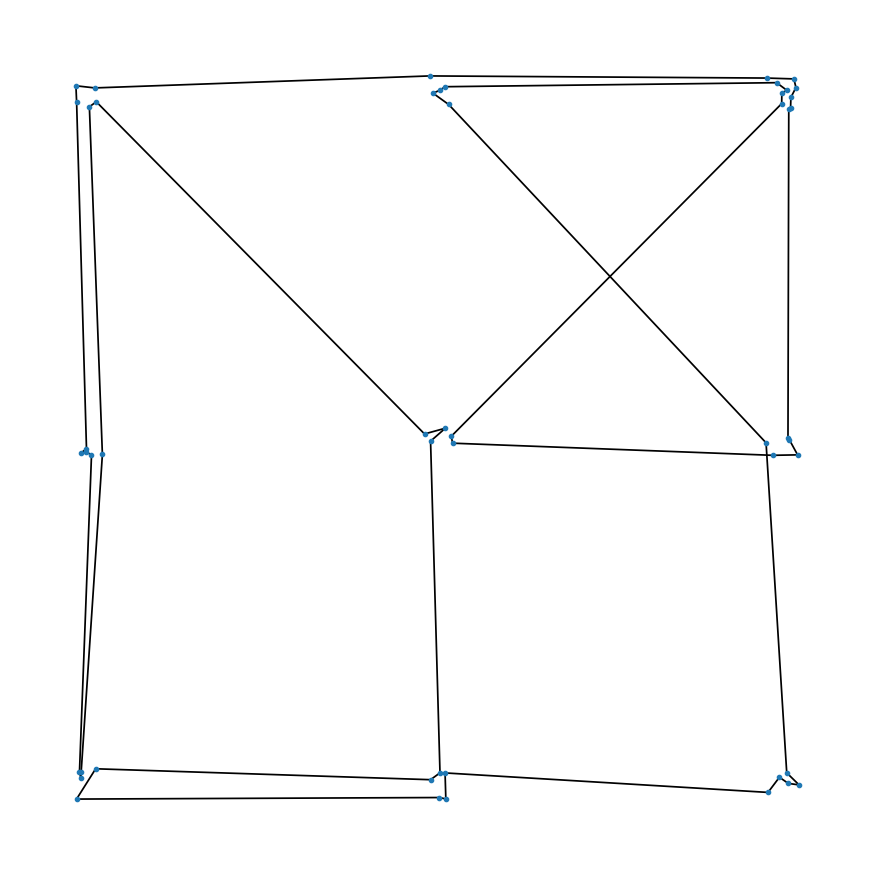

In [30]:
%matplotlib notebook
points_9_groups_50 = generate_9_seperated_groups_of_points(50)
TSP = Annealing_TSP(points_9_groups_50)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_9_groups_50, best_state)
nx.draw(G, pos, node_size = 5)

### 9 odseparowanych grup punktów, n = 100

<IPython.core.display.Javascript object>


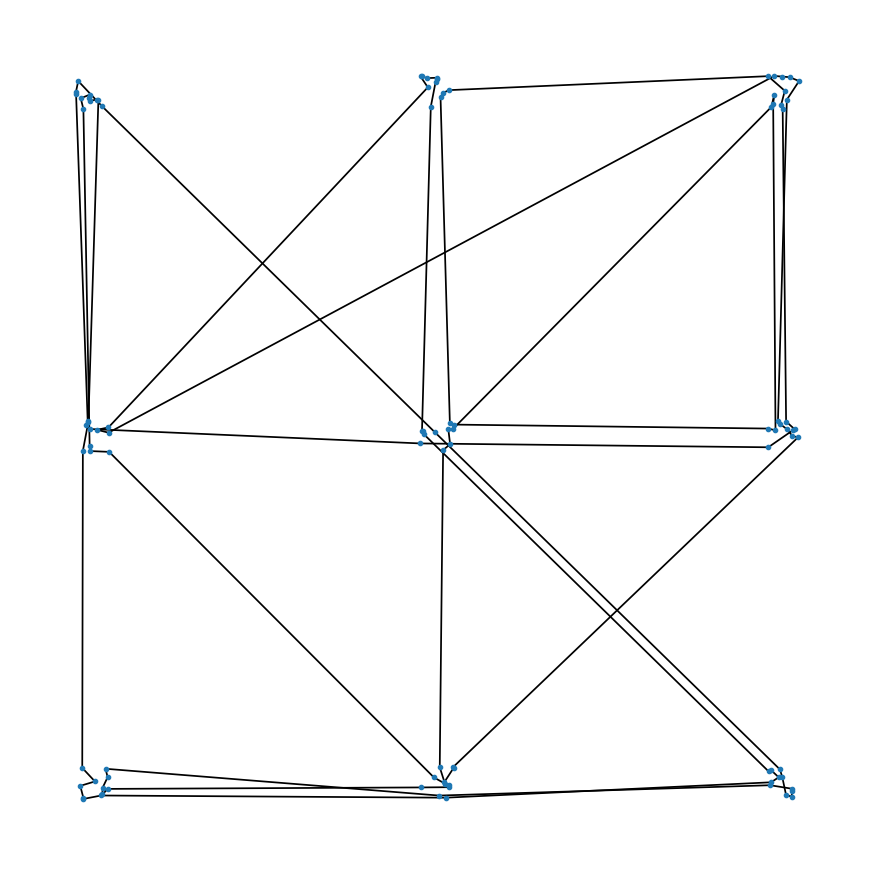

6361.798940107546


In [101]:
%matplotlib notebook
points_9_groups_100 = generate_9_seperated_groups_of_points(100)
TSP = Annealing_TSP(points_9_groups_100)
T = Temperature(500, 0, 0.999)
temperature = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=temperature, steps=50000)
G, pos = show_state(points_9_groups_100, best_state)
nx.draw(G, pos, node_size = 5)

### b) Zbadaj wpływ sposobu generacji sąsiedniego stanu (consecutive swap vs arbitrary swap)

In [11]:
def arbitrary_vs_consecutive(TSP, Temperature=1000, steps=30000):
    plt.rcParams["figure.figsize"] = [9, 3]
    xs_arb, temp_ys, cost_ys_arb, result_arb, best_state, all_states = TSP.solve(temperature=Temperature, swap_type=0, steps=steps, reset=True)
    xs_con, temp_ys, cost_ys_con, result_con, best_state, all_states = TSP.solve(temperature=Temperature, swap_type=1, steps=steps, reset=True)
    plt.plot(xs_arb, cost_ys_arb, "-b", label="arbitrary swaps")
    plt.plot(xs_con, cost_ys_con, "-r", label="consecutive swaps")
    plt.legend(loc="upper right")
    print("Final results achieved:")
    print("Arbitrary swaps:   ", result_arb)
    print("Consecutive swaps: ", result_con)

 ### Zbadaj wpływ funkcji zmiany temperatury na zbieżność procesu optymalizacji.

In [12]:
def different_temperature_functions(TSP, Temperature, steps):
    exp_temp = Temperature.exponential
    lin_temp = Temperature.linear
    xs_exp, temp_ys, cost_ys_exp, result_exp, best_state, all_states = TSP.solve(temperature=exp_temp, steps=steps, reset=True)
    xs_lin, temp_ys, cost_ys_lin, result_lin, best_state, all_states = TSP.solve(temperature=lin_temp, steps=steps, reset=True)
    plt.plot(xs_exp, cost_ys_exp, "-b", label="Exponential")
    plt.plot(xs_lin, cost_ys_lin, "-r", label="Linear")
    plt.legend(loc="upper right")
    print("Final results achieved:")
    print("Exponential temperature: ", result_exp)
    print("Linear temperature:      ", result_lin)

### zestaw 1. - 10 losowych punktów

In [180]:
points_1 = generate_random_points(10, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_1)
T0_exp = 10
q_exp = 0.9995
steps = 7000
T0_lin = 8
q_lin = (T0_lin - pow(q_exp, steps)) / steps
T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
T_lin = T.linear
T_exp = T.exponential

<IPython.core.display.Javascript object>


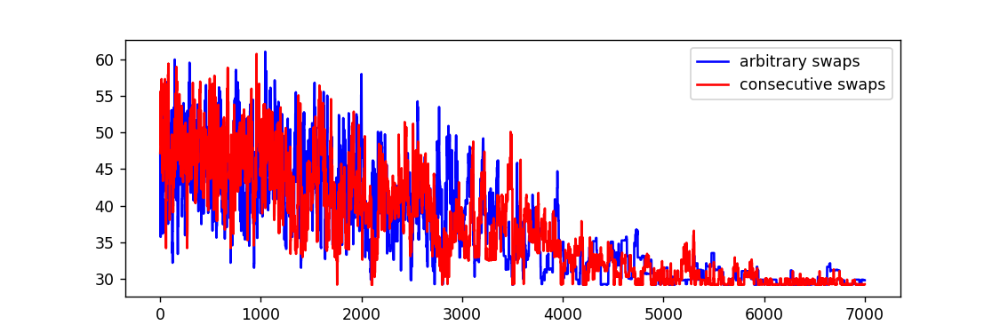

Final results achieved:
Arbitrary swaps:    29.17817948429056
Consecutive swaps:  29.178179484290563


In [178]:
%matplotlib notebook
arbitrary_vs_consecutive(TSP, Temperature=T_exp, steps=steps)

<IPython.core.display.Javascript object>


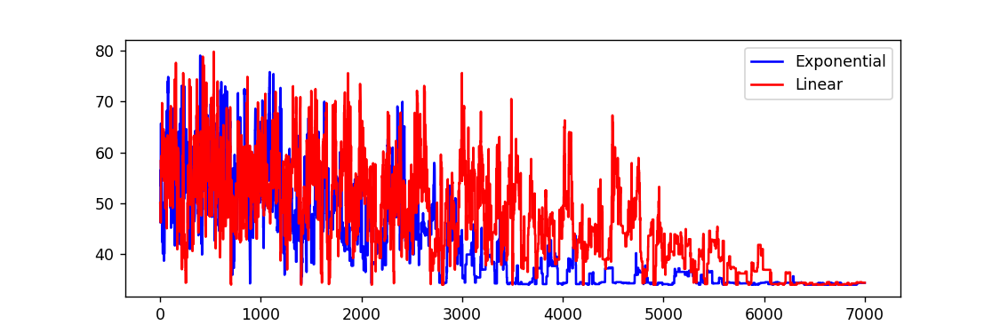

Final results achieved:
Exponential temperature:  34.043140441647296
Linear temperature:       34.04314044164729


In [181]:
%matplotlib notebook
different_temperature_functions(TSP, Temperature=T, steps=steps)

### zestaw 2. - 50 losowych punktów

In [195]:
points_2 = generate_random_points(50, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_2)
T0_exp = 1000
q_exp = 0.9995
steps = 30000
T0_lin = 5
q_lin = (T0_lin - pow(q_exp, steps)) / steps
T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
T_lin = T.linear
T_exp = T.exponential

<IPython.core.display.Javascript object>


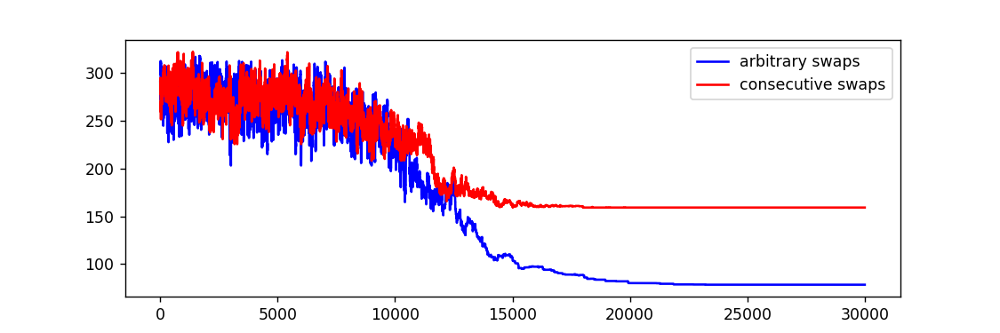

Final results achieved:
Arbitrary swaps:    78.36344445424011
Consecutive swaps:  159.11001040350752


In [197]:
%matplotlib notebook
arbitrary_vs_consecutive(TSP, Temperature=T_exp, steps=steps)

<IPython.core.display.Javascript object>


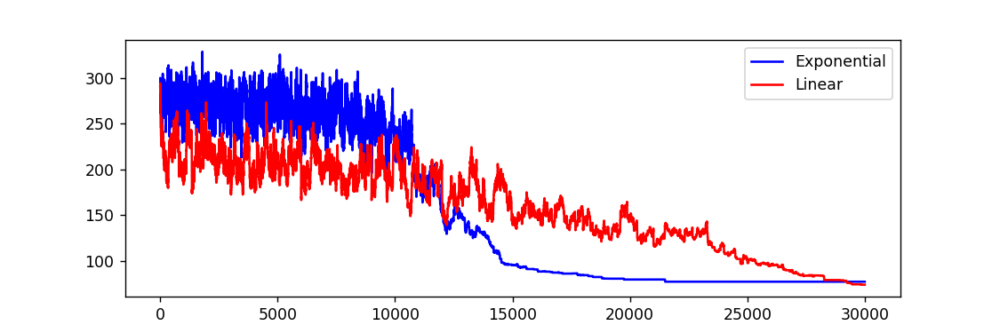

Final results achieved:
Exponential temperature:  77.05892334331139
Linear temperature:       73.77609095954784


In [196]:
%matplotlib notebook
different_temperature_functions(TSP, Temperature=T, steps=steps)

### zestaw 3. - 100 losowych punktów 

In [201]:
points_3 = generate_random_points(100, Point(0,0), Point(10,10))
TSP = Annealing_TSP(points_3)
T0_exp = 1000
q_exp = 0.9995
steps = 30000
T0_lin = 5
q_lin = 6/5 * (T0_lin - pow(q_exp, steps)) / steps
T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
T_lin = T.linear
T_exp = T.exponential

<IPython.core.display.Javascript object>


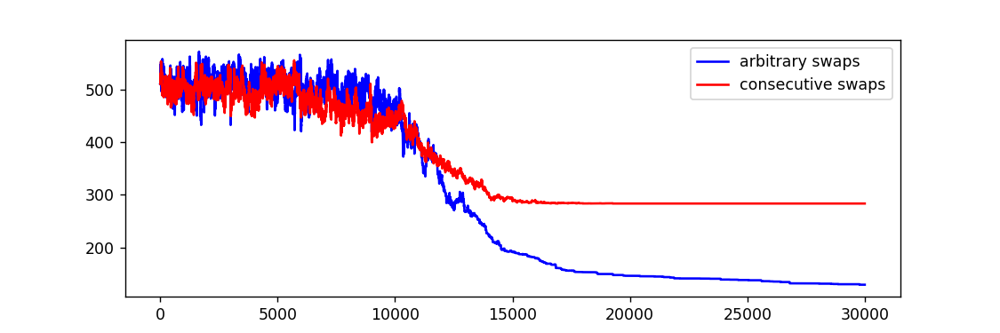

Final results achieved:
Arbitrary swaps:    129.11321602839095
Consecutive swaps:  283.34879922875587


In [199]:
%matplotlib notebook
arbitrary_vs_consecutive(TSP, Temperature=T_exp, steps=steps)

<IPython.core.display.Javascript object>


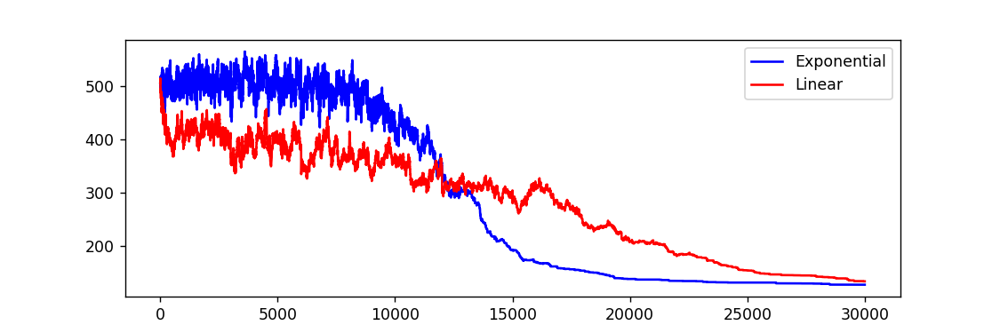

Final results achieved:
Exponential temperature:  126.73823918708507
Linear temperature:       133.07650592632507


In [202]:
%matplotlib notebook
different_temperature_functions(TSP, Temperature=T, steps=steps)

### zestaw 4. - 100 punktów z rozkładu normalnego

In [203]:
mean_a = [0,0]
cov_a = [[1, 0], 
         [0, 1]]
points_4 = generate_2d_normal_distribution_points(100, mean_a, cov_a)
TSP = Annealing_TSP(points_4)
T0_exp = 1000
q_exp = 0.9995
steps = 30000
T0_lin = 5
q_lin = 6/5 * (T0_lin - pow(q_exp, steps)) / steps
T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
T_lin = T.linear
T_exp = T.exponential

<IPython.core.display.Javascript object>


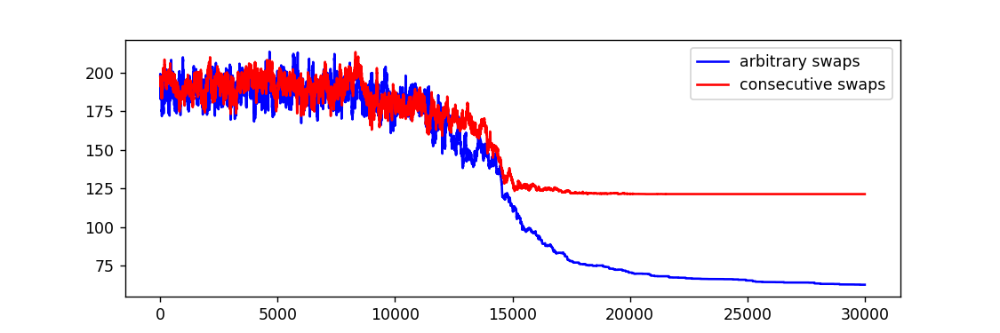

Final results achieved:
Arbitrary swaps:    62.56034959430779
Consecutive swaps:  121.34599727323439


In [204]:
%matplotlib notebook
arbitrary_vs_consecutive(TSP, Temperature=T_exp, steps=steps)

<IPython.core.display.Javascript object>


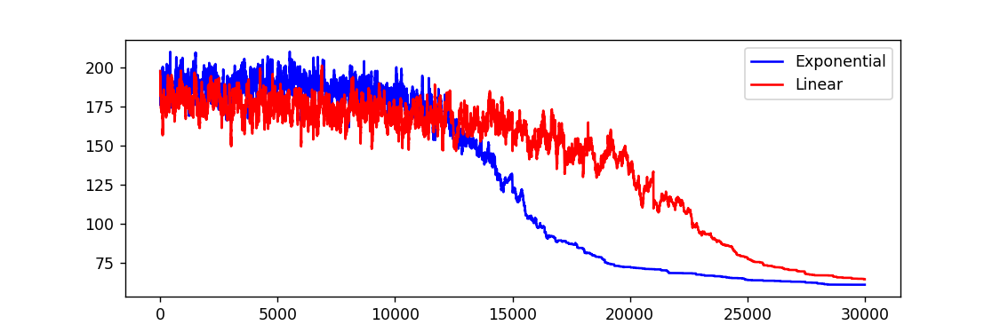

Final results achieved:
Exponential temperature:  61.28541643927005
Linear temperature:       64.72726615250335


In [205]:
%matplotlib notebook
different_temperature_functions(TSP, Temperature=T, steps=steps)

### zestaw 5 - 100 punktów w 9 odseparowanych grupach

In [220]:
points_5 = generate_9_seperated_groups_of_points(100)
TSP = Annealing_TSP(points_5)
T0_exp = 100000
q_exp = 0.9995
steps = 30000
T0_lin = 500
q_lin = 6/5 * (T0_lin - pow(q_exp, steps)) / steps
T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
T_lin = T.linear
T_exp = T.exponential

<IPython.core.display.Javascript object>


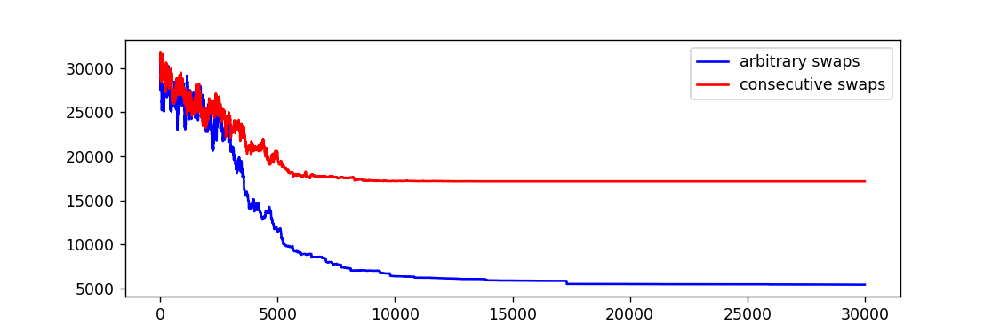

Final results achieved:
Arbitrary swaps:    5412.488614422119
Consecutive swaps:  17154.041050129093


In [208]:
%matplotlib notebook
arbitrary_vs_consecutive(TSP, Temperature=T_exp, steps=steps)

<IPython.core.display.Javascript object>


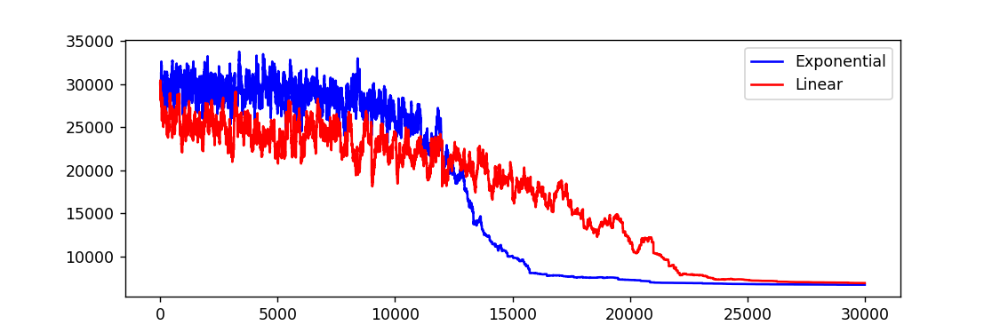

Final results achieved:
Exponential temperature:  6741.430291612087
Linear temperature:       6934.65402694493


In [221]:
%matplotlib notebook
different_temperature_functions(TSP, Temperature=T, steps=steps)

### c) Przedstaw wizualizację (saoptimset) działania procedury minimalizującej funkcję celu.

#### Poniższa wizualizacja przedstawia jak zmieniał się najlepszy osiągniety jak dotąd rezultat

In [13]:
def visualize(points, all_states, node_size=5):
    plt.rcParams["figure.figsize"] = [7, 7]
    plt.rcParams["figure.autolayout"] = True

    fig = plt.figure()

    G = nx.Graph()
    for count, point in enumerate(points):
        G.add_node(count, pos=(point.get_x(), point.get_y()))
    for i in range(len(points) - 1):
        G.add_edge(all_states[0][i], all_states[-1][i+1])
    G.add_edge(all_states[0][0], all_states[-1][-1])
    pos=nx.get_node_attributes(G,'pos')
    nx.draw(G,pos, node_size=node_size)
    def animate(i):
        fig.clear()
        G.remove_edges_from(list(G.edges))
        for j in range(len(points) - 1):
            G.add_edge(all_states[i][j], all_states[i][j+1])
        G.add_edge(all_states[i][0], all_states[i][-1])
        nx.draw(G,pos, node_size=node_size)
    
    return animation.FuncAnimation(fig, animate, frames=len(all_states), interval=10000/len(all_states), repeat=False)

In [14]:
points = generate_9_seperated_groups_of_points(50)
TSP = Annealing_TSP(points)
T0_exp = 100000
q_exp = 0.9995
steps = 30000
T = Temperature(0, 0, T0_exp, q_exp)
T_exp = T.exponential
xs, temp_ys, cost_ys, result, best_state, all_states = TSP.solve(temperature=T_exp, steps=30000)

<img src="scatter.gif" width="750" align="center">

### WNIOSKI I OBSERWACJE

* W pojedynku (consecutive swap vs arbitrary swap) czyli porównaniu sposobów zamieniania dwóch losowych punktów z zamienianiem dwóch punktów sąsiadujących w cyklu, zamienanie losowych punktów już przy 50 punktach w grafie okazywało się lepsze (przy 10 punktach wyniki były praktycznie równe). Robiąc research do sprawozdania natknąłem się na tezę, iż powinno być odwrotnie, jednak w przypadku moich testów w każdym wynik wprost pokazywał, że zamiana dwóch looswych punktów przynosi nam dużo lepsze rezultaty. Może to być spowodowane brakiem przebadania odpowiednio dużej różnorodności danych.
* Porównałem dwie funkcje temperatury (liniową i wykładniczą) i poprzez manewrowanie startowymi temperaturami dla obu oraz szybkością spadku temperatury dla wszystkich testów otrzymałem praktycznie takie same końcowe wyniki przy czym było to przy ograniczonej liczbie kroków (zazwyczaj 30 tysięcy). Najlepsze rezultaty zostały uzyskane kiedy funkcja liniowa miała niską temperaturę początkową (rzędu 10) oraz bardzo wolne tempo spadku, natomiast funkcja wykładnicza osiągała lepsze rezultaty przy wysokiej temperaturze początkowej (rzędu 10 tysięcy) i stosunkowo szybkiemu spadkowi.

***

## 1.2 Obraz binarny

In [19]:
class BinaryImage:
    def __init__(self, size=10, density=0.1):
        self.size         = size
        self.density      = density
        self.blacks       = np.round(size * size * density).astype(int)
        self.image        = self.create_random_image()
        self.temperature  = None
        self.best_image   = None
        self.best_energy  = None
        self.curr_image   = None
        self.curr_energy  = None
        self.all_images   = []
    
    def create_random_image(self):
        image = np.ones(shape=(self.size, self.size))
        for i in range(self.blacks):
            x = np.random.randint(self.size)
            y = np.random.randint(self.size)
            while not image[x][y]:
                x = np.random.randint(self.size)
                y = np.random.randint(self.size)
            image[x][y] = 0
        return image
    
    def show_image(self, image=None):
        fig=plt.figure(figsize=(8, 4))
        if image is None:
            image = self.image
        fig.add_subplot(1, 2, 1)
        plt.imshow(self.image, cmap=plt.cm.gray)
        fig.add_subplot(1, 2, 2)
        plt.imshow(image, cmap=plt.cm.gray)
        plt.show()
        
    def get_total_energy(self, image=None):
        if image is None:
            image = self.curr_image.copy()
        total_energy = 0
        for x in range(self.size):
            for y in range(self.size):
                total_energy += self.get_energy(x, y, image)
        return total_energy
    
    def reset_data(self):
        self.best_image, self.curr_image = self.image.copy(), self.image.copy()
        self.best_energy, self.curr_energy = self.get_total_energy(), self.get_total_energy()
    
    def update_best(self) -> None:
        if self.best_energy > self.curr_energy:
            self.best_energy = self.curr_energy
            self.best_image = self.curr_image
    
    def swap(self, i: int) -> None:
        image = self.curr_image.copy()

        for index in range(5):
            x1, x2, y1, y2 = self.arbitrary_swap()
            while image[x1][y1] == image[x2][y2]:
                x1, x2, y1, y2 = self.arbitrary_swap()
            image[x1][y1], image[x2][y2] = image[x2][y2], image[x1][y1]
        
        new_energy = self.get_total_energy(image)

        if new_energy < self.curr_energy:
            self.curr_image = image
            self.curr_energy = new_energy
            self.all_images.append(image) 
            return

        probability = np.exp((self.curr_energy - new_energy) / self.temperature(i))
 
        if np.random.choice([1,0], p=[probability, 1 - probability]):
            self.curr_image = image
            self.curr_energy = new_energy
            self.all_images.append(image) 
    
    def arbitrary_swap(self) -> ([int], [int]):
        return  np.random.randint(self.size), np.random.randint(self.size),\
                np.random.randint(self.size), np.random.randint(self.size)
    
    def solve(self, temperature, get_energy, steps=1000, visualization=False) -> None:
        self.temperature = temperature
        self.get_energy = get_energy
        self.reset_data()
        xs = [i for i in range(1, steps)]
        cost_ys = []
        temp_ys = []

        for i in range(1, steps):
            cost_ys.append(self.curr_energy)  
            temp_ys.append(self.temperature(i))
            self.swap(i)
            self.update_best()
            
        return xs, temp_ys, cost_ys, self.best_energy, self.best_image, self.all_images

### W jaki sposób można generować stany sąsiednie? 

In [20]:
class Neighbours:
    def __init__(self):
        self.versions = {
            0:self.chessboard_4_neighbours,
            1:self.chessboard_8_neighbours,
            2:self.chessboard_8_16_neighbours,
            3:self.stairs_right_8_neighbours,
            4:self.stairs_left_8_neighbours,
            5:self.stripes_vertical_4_neighbours,
            6:self.stripes_vertical_8_neighbours,
            7:self.stripes_horizontal_4_neighbours,
            8:self.stripes_horizontal_8_neighbours,
        }
    
    def get_framed_image(self, image, frame_width):
        size = image.shape[0] + 2 * frame_width
        framed_image = np.full((size, size), 2)
        framed_image[frame_width : -frame_width, frame_width : -frame_width] = image
        return framed_image
            
    def chessboard_4_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 4
        
        for i in range(3):
            if i % 2: continue
            for j in range(3):
                if j % 2: continue
                if image[x+i][y+j] == value:
                    energy -= 1
                elif image[x+i][y+j] == 2:
                    energy -= 1/2
                    
        return energy
    
    def chessboard_8_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 8
        
        for i in range(3):
            for j in range(3):
                if i == 1 and j == 1:
                    continue
                if i%2 == 0 and j%2 == 0:
                    if image[x+i][y+j] == value:
                        energy -= 1
                    if image[x+i][y+j] == 2:
                        energy -= 1/2
                else:
                    if image[x+i][y+j] == 1 - value:
                        energy -= 1
                    if image[x+i][y+j] == 2:
                        energy -= 1/2
                    
        return energy
    
    def chessboard_8_16_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 2)
        value = image[x+2][y+2]
        energy = 24
        
        for i in range(5):
            for j in range(5):
                if i == 2 and j == 2:
                    continue
                if i%2 == 0 and j%2 == 0:
                    if image[x+i][y+j] == value:
                        energy -= 1
                    if image[x+i][y+j] == 2:
                        energy -= 1/2
                else:
                    if image[x+i][y+j] == 1 - value:
                        energy -= 1
                    if image[x+i][y+j] == 2:
                        energy -= 1/2
        
        return energy
    
    def stairs_right_8_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 8
            
        if image[x+2][y+2] == value:
            energy -= 1
        elif image[x+2][y+2] == 2:
            energy -= 1/2
        
        if image[x][y] == value:
            energy -= 1
        elif image[x][y] == 2:
            energy -= 1/2
        
        if image[x+2][y] != value:
            energy -= 1
        elif image[x+2][y] == 2:
            energy -= 1/2
            
        if image[x][y+2] != value:
            energy -= 1
        elif image[x][y+2] == 2:
            energy -= 1/2
            
        if image[x+1][y+2] == image[x][y+1]:
            energy -= 1
         
        if image[x][y+1] != image[x+1][y]:
            energy -= 1
            
        if image[x+1][y] == image[x+2][y+1]:
            energy -= 1
        
        if image[x+2][y+1] != image[x+1][y+2]:
            energy -= 1
            
        return energy
    
    def stairs_left_8_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 8
            
        if image[x+2][y+2] != value:
            energy -= 1
        elif image[x+2][y+2] == 2:
            energy -= 1/2
        
        if image[x][y] != value:
            energy -= 1
        elif image[x][y] == 2:
            energy -= 1/2
        
        if image[x+2][y] == value:
            energy -= 1
        elif image[x+2][y] == 2:
            energy -= 1/2
            
        if image[x][y+2] == value:
            energy -= 1
        elif image[x][y+2] == 2:
            energy -= 1/2
            
        if image[x+1][y+2] != image[x][y+1]:
            energy -= 1
         
        if image[x][y+1] == image[x+1][y]:
            energy -= 1
            
        if image[x+1][y] != image[x+2][y+1]:
            energy -= 1
        
        if image[x+2][y+1] == image[x+1][y+2]:
            energy -= 1
            
        return energy
    
    def stripes_vertical_4_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 4
        
        if image[x+2][y+1] == value:
            energy -= 1
        elif image[x+2][y+1] == 2:
            energy -= 1/2
        
        if image[x][y+1] == value:
            energy -= 1
        elif image[x][y+1] == 2:
            energy -= 1/2
            
        if image[x+1][y] == 1-value:
            energy -= 1
        elif image[x+1][y] == 2:
            energy -= 1/2
        
        if image[x+1][y+2] == 1-value:
            energy -= 1
        elif image[x+1][y+2] == 2:
            energy -= 1/2
        
        return energy
    
    def stripes_vertical_8_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 8
        
        for i in range(3):
            for j in range(3):
                if i == 1 and j == 1:
                    continue
                if j % 2 == 0:
                    if image[x+i][y+j] == 1-value:
                        energy -= 1
                    elif image[x+i][y+j] == 2:
                        energy -= 1/2
                else:
                    if image[x+i][y+j] == value:
                        energy -= 1
                    elif image[x+i][y+j] == 2:
                        energy -= 1/2
        
        return energy
    
    def stripes_horizontal_4_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 4
        
        
        if image[x+2][y+1] == 1-value:
            energy -= 1
        elif image[x+2][y+1] == 2:
            energy -= 1/2
        
        if image[x][y+1] == 1-value:
            energy -= 1
        elif image[x][y+1] == 2:
            energy -= 1/2
            
        if image[x+1][y] == value:
            energy -= 1
        elif image[x+1][y] == 2:
            energy -= 1/2
        
        if image[x+1][y+2] == value:
            energy -= 1
        elif image[x+1][y+2] == 2:
            energy -= 1/2
        
        return energy
    
    def stripes_horizontal_8_neighbours(self, x, y, org_image):
        image = self.get_framed_image(org_image, 1)
        value = image[x+1][y+1]
        energy = 8
        
        for i in range(3):
            for j in range(3):
                if i == 1 and j == 1:
                    continue
                if i % 2 == 0:
                    if image[x+i][y+j] == 1-value:
                        energy -= 1
                    elif image[x+i][y+j] == 2:
                        energy -= 1/2
                else:
                    if image[x+i][y+j] == value:
                        energy -= 1
                    elif image[x+i][y+j] == 2:
                        energy -= 1/2
        
        return energy
    
    def get_function(self, version):
        if version not in self.versions:
            print("error bad index")
            return
        return self.versions[version] 

In [31]:
def make(BinImage, energy_func, temperature, steps=70000):
    plt.rcParams["figure.figsize"] = [9, 3]
    xs, temp_ys, cost_ys, result, best_state, all_states = BinImage.solve(temperature=temperature,
                                                                          get_energy=energy_func,
                                                                          steps=steps)
    plt.plot(xs, cost_ys)
    BinImage.show_image(image=best_state)
    return result

### Wygeneruj losowy obraz binarny o rozmiarze n×n i wybranej gęstości δ czarnych punktów, δ =  0.1,0.3,0.4. 

In [322]:
BI1 = BinaryImage(10, 0.4)

In [323]:
BI2 = BinaryImage(20, 0.4)

In [324]:
BI3 = BinaryImage(30, 0.4)

In [22]:
N = Neighbours()
chessboard_4    = N.get_function(0)
chessboard_8    = N.get_function(1)
chessboard_8_16 = N.get_function(2)
stairs_right_8  = N.get_function(3)
stairs_left_8   = N.get_function(4)
stripes_v_4     = N.get_function(5)
stripes_v_8     = N.get_function(6)
stripes_h_4     = N.get_function(7)
stripes_h_8     = N.get_function(8)

### Korzystając  z  różnego  typu  sąsiedztwa  (4-sąsiadów,  8-sąsiadów, 8-16-sąsiadów) zaproponuj funkcję energii (np. w bliskiej odległości te same kolory przyciągają się, a w dalszej odpychają się) i dokonaj jej minimalizacji za pomocą algorytmu symulowanego wyżarzania.

In [23]:
def get_basic_temperature():
    T0_exp= 1000 
    q_exp = 0.9997
    T0_lin = 0
    q_lin = 0
    T = Temperature(T0_lin, q_lin, T0_exp, q_exp)
    return T.exponential

In [291]:
Basic_Temperature = get_basic_temperature()

### Jak różnią się uzyskane wyniki w zależności od: 
* rodzaju sąsiedztwa
* wybranej funkcji energii
* szybkości spadku temperatury

### SZACHOWNICA 4-sasiadow

<IPython.core.display.Javascript object>


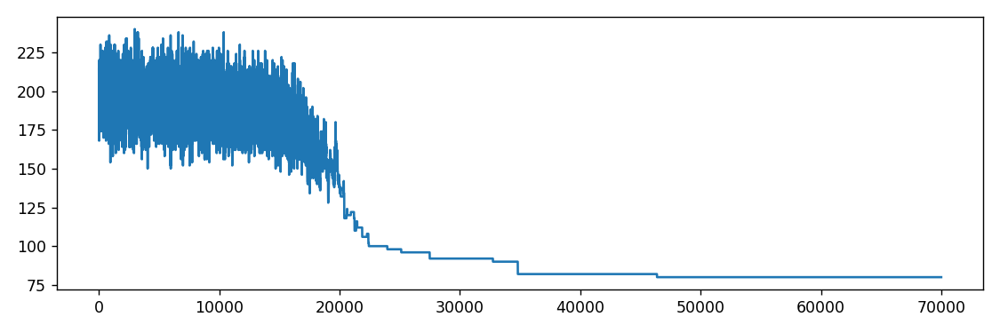

<IPython.core.display.Javascript object>


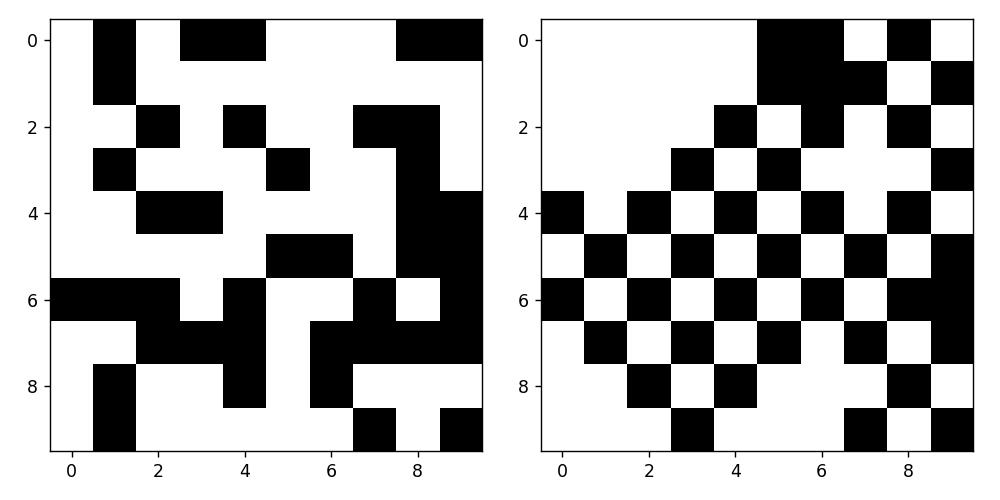

In [336]:
%matplotlib notebook
make(BI1, chessboard_4, Basic_Temperature)

<IPython.core.display.Javascript object>


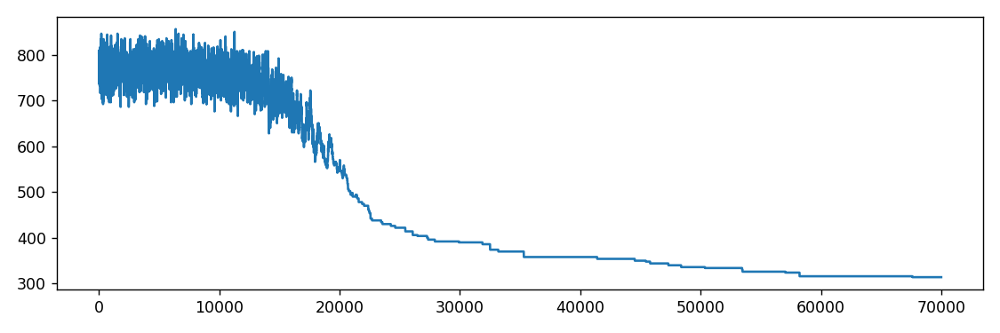

<IPython.core.display.Javascript object>


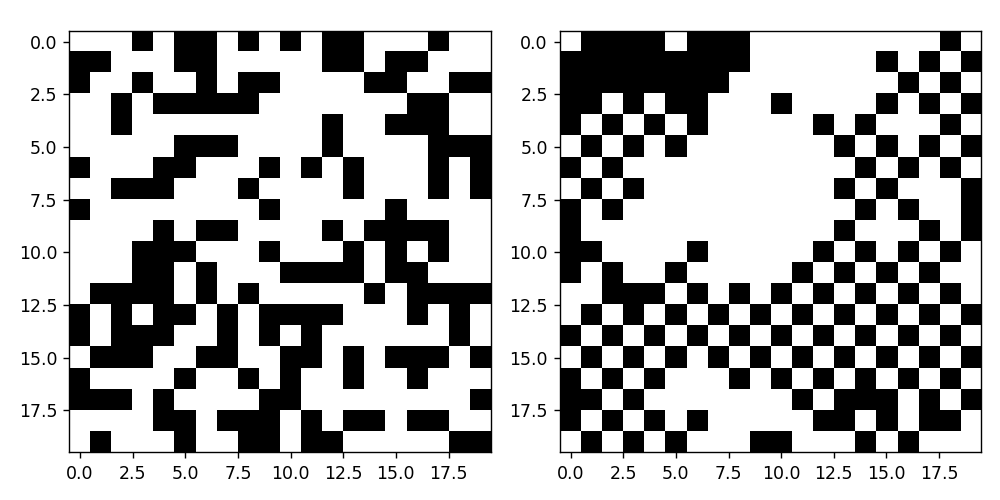

In [337]:
%matplotlib notebook
make(BI2, chessboard_4, Basic_Temperature)

<IPython.core.display.Javascript object>


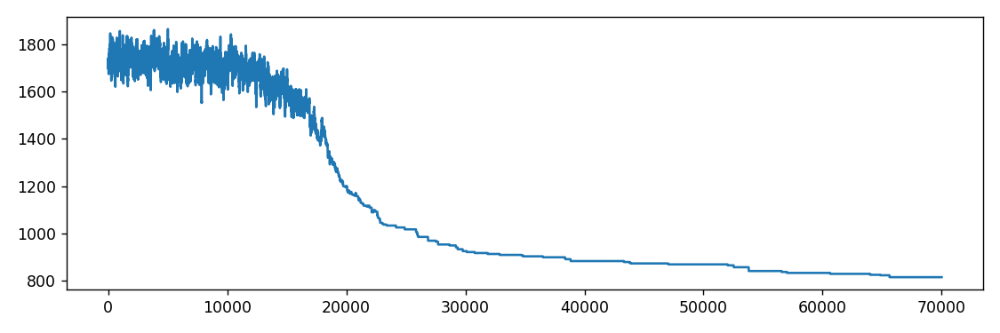

<IPython.core.display.Javascript object>


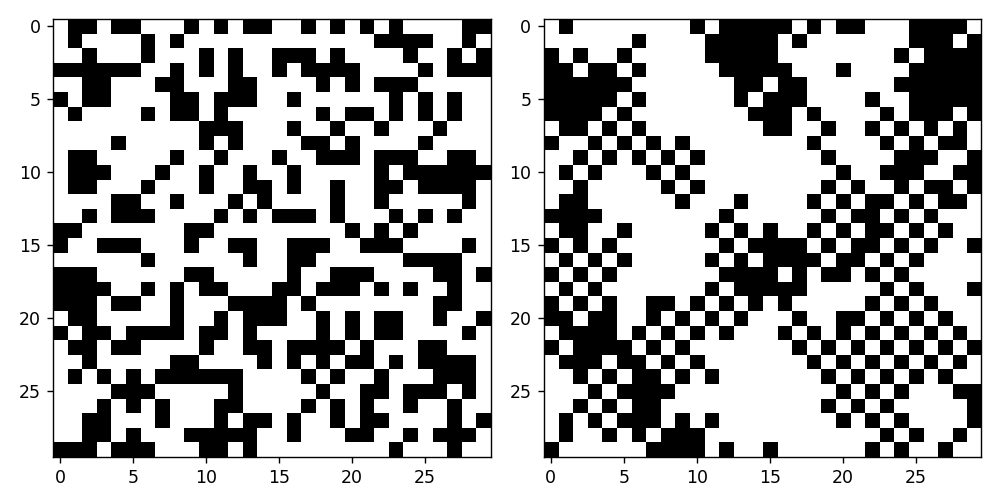

In [338]:
%matplotlib notebook
make(BI3, chessboard_4, Basic_Temperature)

### SZACHOWNICA 8-sasiadow

<IPython.core.display.Javascript object>


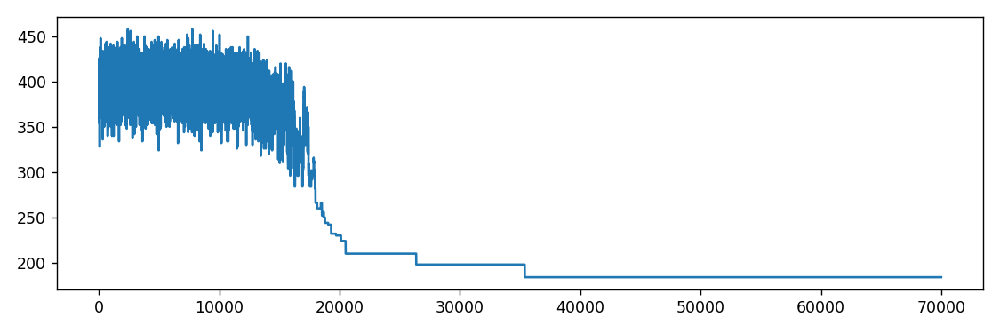

<IPython.core.display.Javascript object>


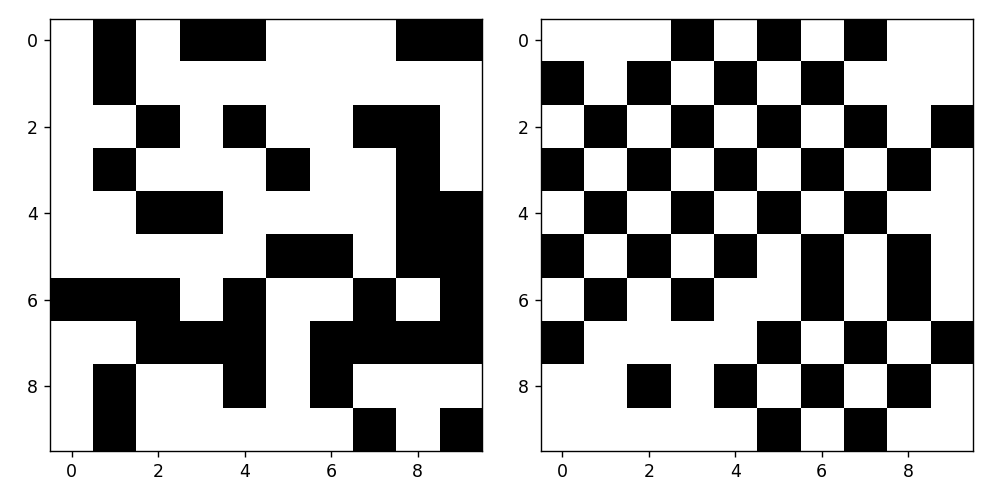

In [339]:
%matplotlib notebook
make(BI1, chessboard_8, Basic_Temperature)

<IPython.core.display.Javascript object>


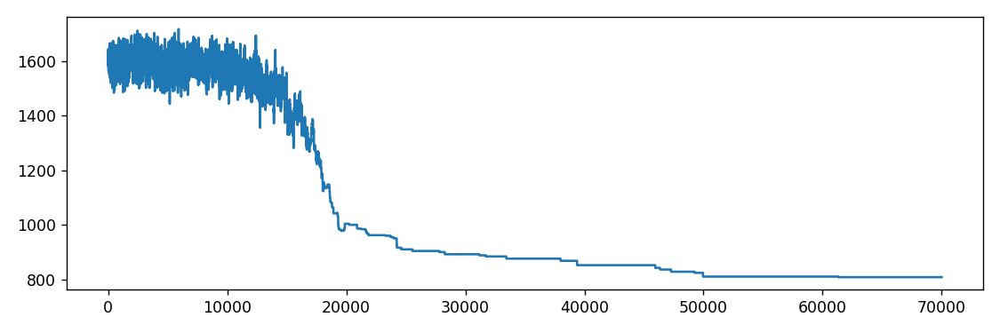

<IPython.core.display.Javascript object>


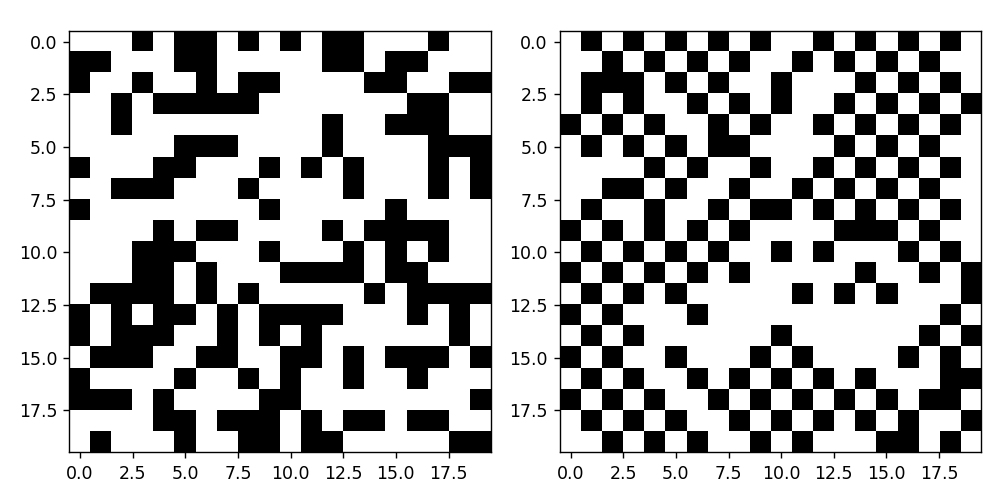

In [340]:
%matplotlib notebook
make(BI2, chessboard_8, Basic_Temperature)

<IPython.core.display.Javascript object>


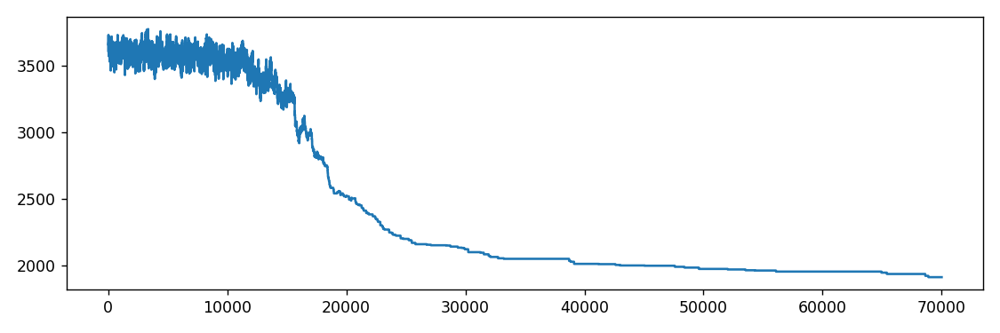

<IPython.core.display.Javascript object>


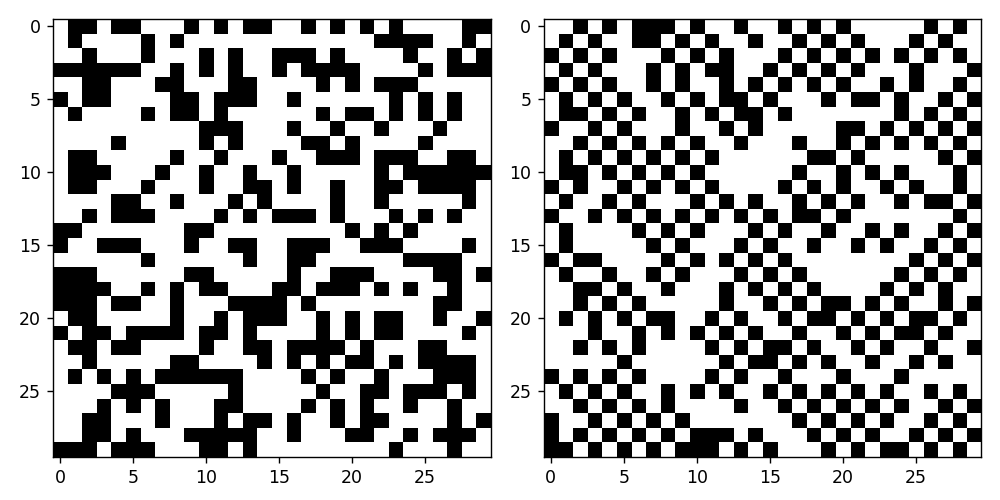

In [341]:
%matplotlib notebook
make(BI3, chessboard_8, Basic_Temperature)

### SZACHOWNICA 8-16-sasiadow

<IPython.core.display.Javascript object>


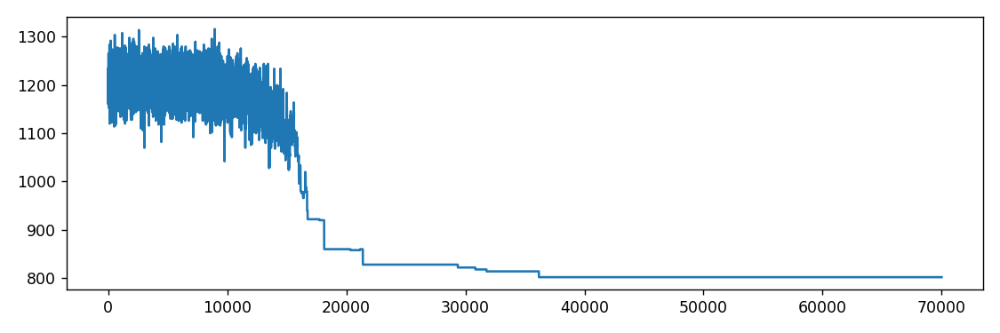

<IPython.core.display.Javascript object>


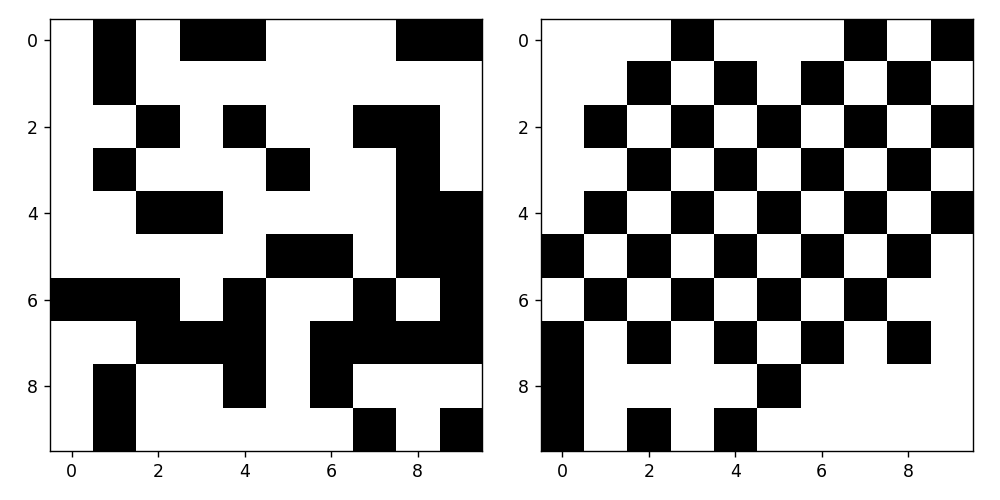

In [342]:
%matplotlib notebook
make(BI1, chessboard_8_16, Basic_Temperature)

<IPython.core.display.Javascript object>


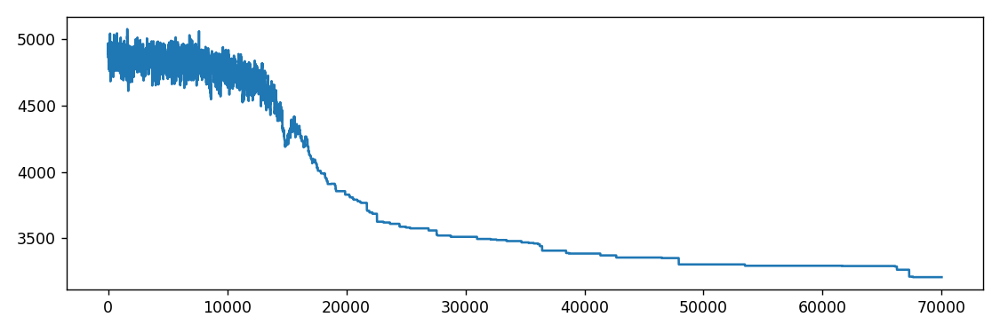

<IPython.core.display.Javascript object>


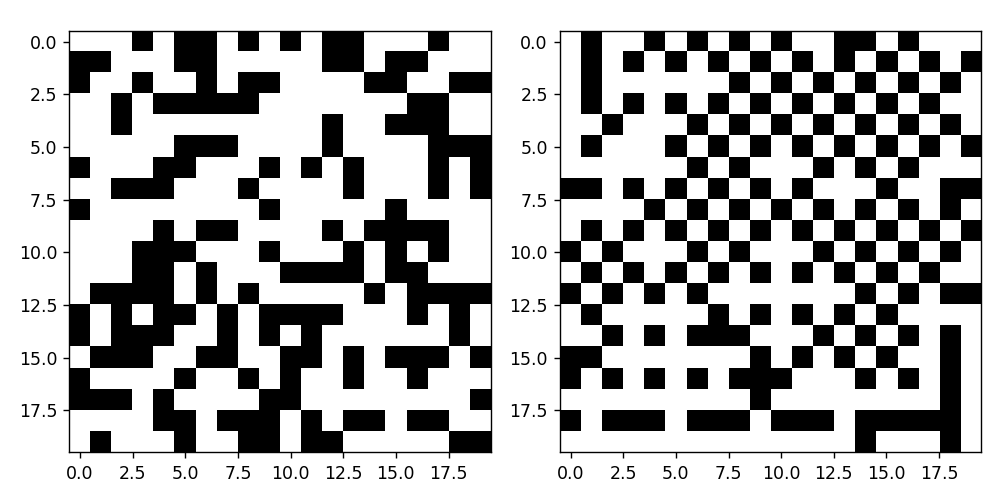

In [343]:
%matplotlib notebook
make(BI2, chessboard_8_16, Basic_Temperature)

<IPython.core.display.Javascript object>


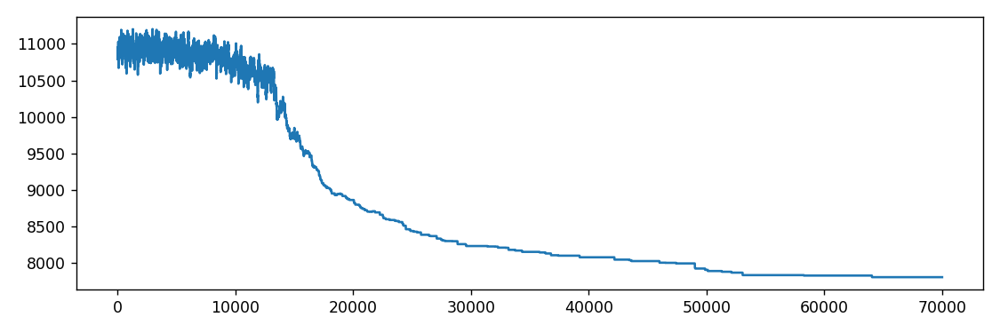

<IPython.core.display.Javascript object>


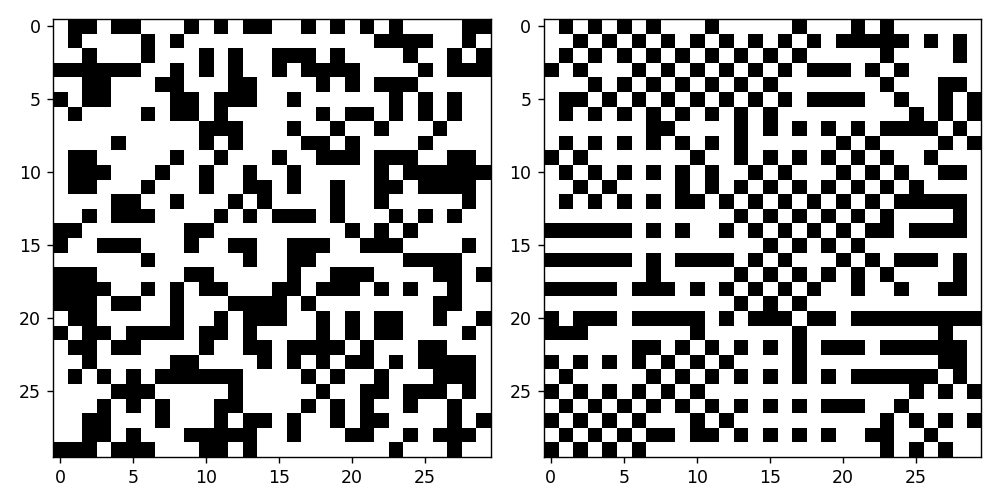

In [344]:
%matplotlib notebook
make(BI3, chessboard_8_16, Basic_Temperature)

### Schody w prawo 8-sasiadow

<IPython.core.display.Javascript object>


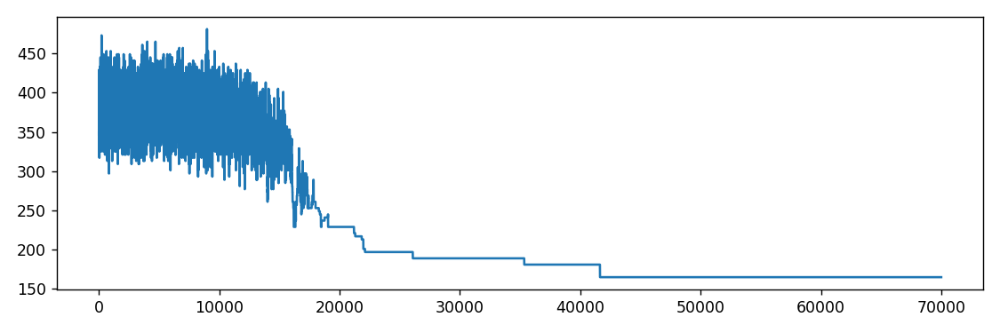

<IPython.core.display.Javascript object>


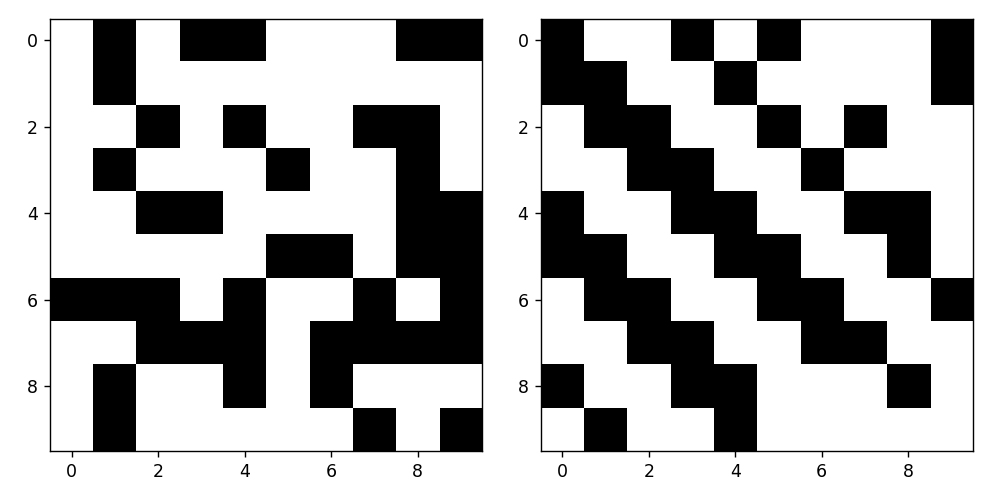

In [345]:
%matplotlib notebook
make(BI1, stairs_right_8, Basic_Temperature)

<IPython.core.display.Javascript object>


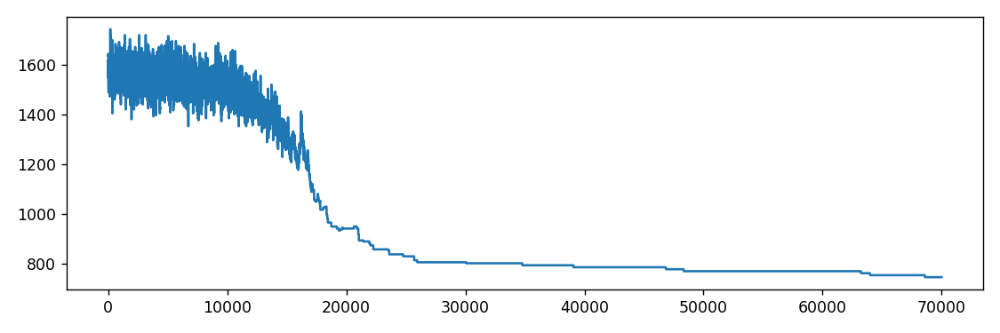

<IPython.core.display.Javascript object>


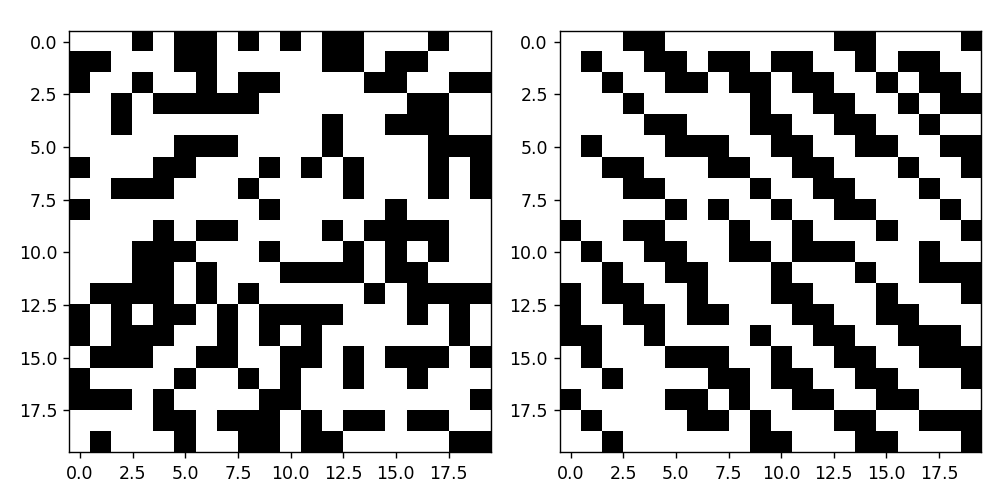

In [346]:
%matplotlib notebook
make(BI2, stairs_right_8, Basic_Temperature)

<IPython.core.display.Javascript object>


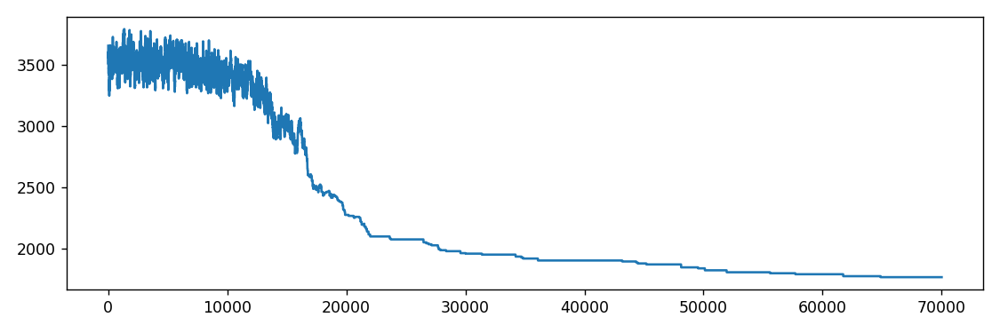

<IPython.core.display.Javascript object>


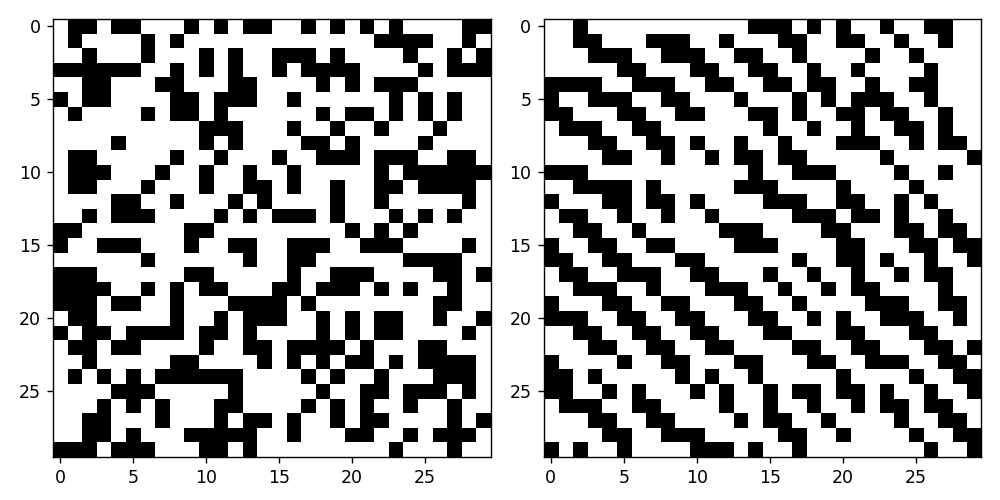

In [347]:
%matplotlib notebook
make(BI3, stairs_right_8, Basic_Temperature)

### Schody w lewo 8-sasiadow

<IPython.core.display.Javascript object>


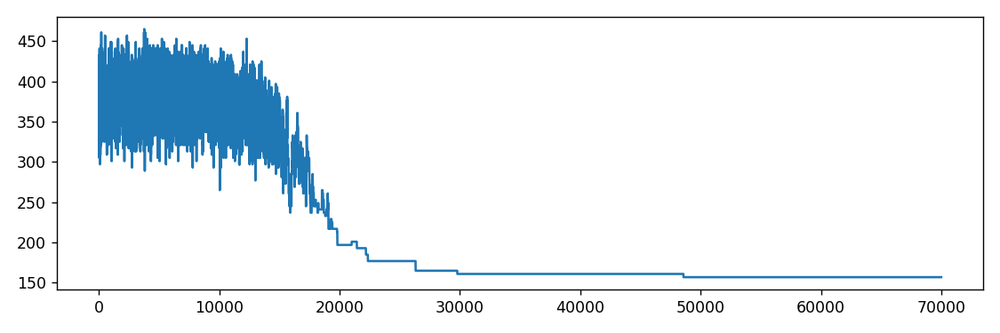

<IPython.core.display.Javascript object>


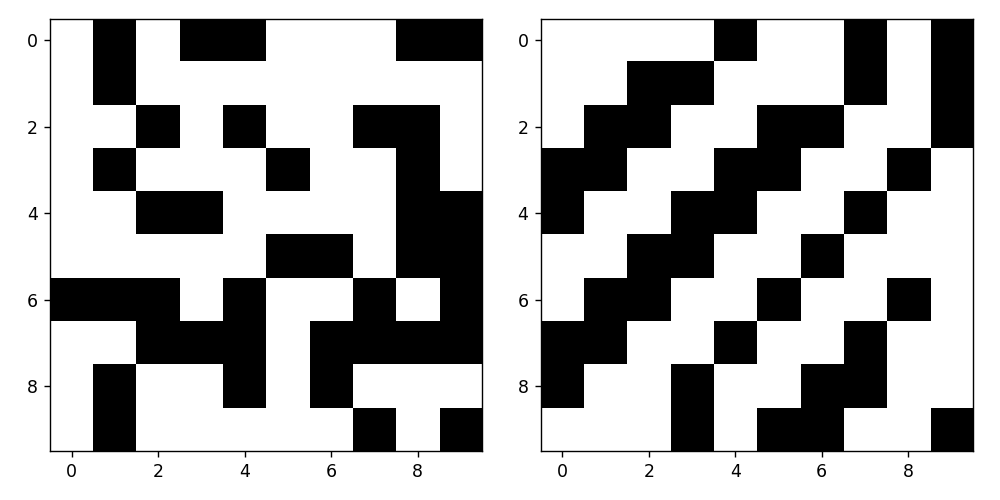

In [348]:
%matplotlib notebook
make(BI1, stairs_left_8, Basic_Temperature)

<IPython.core.display.Javascript object>


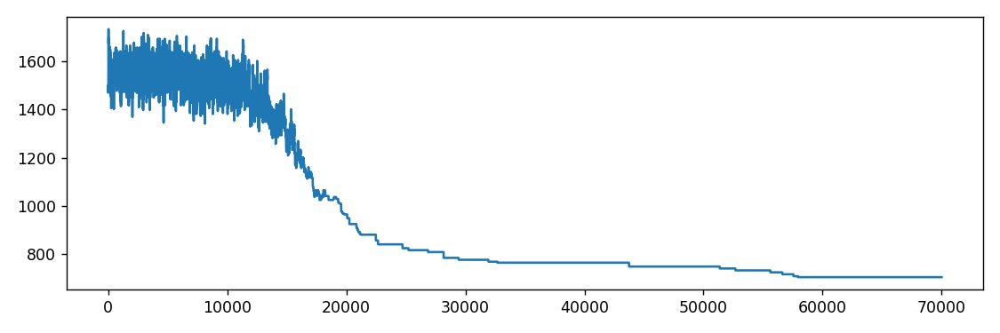

<IPython.core.display.Javascript object>


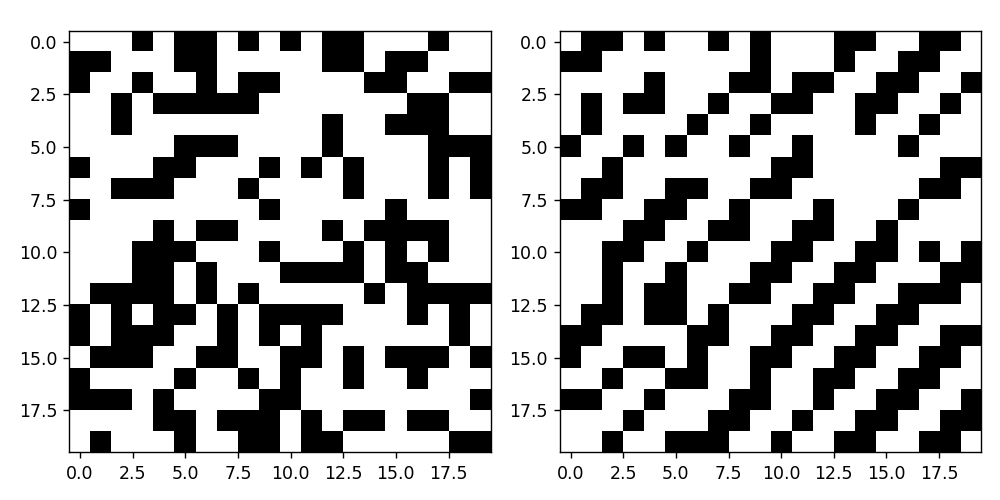

In [349]:
%matplotlib notebook
make(BI2, stairs_left_8, Basic_Temperature)

<IPython.core.display.Javascript object>


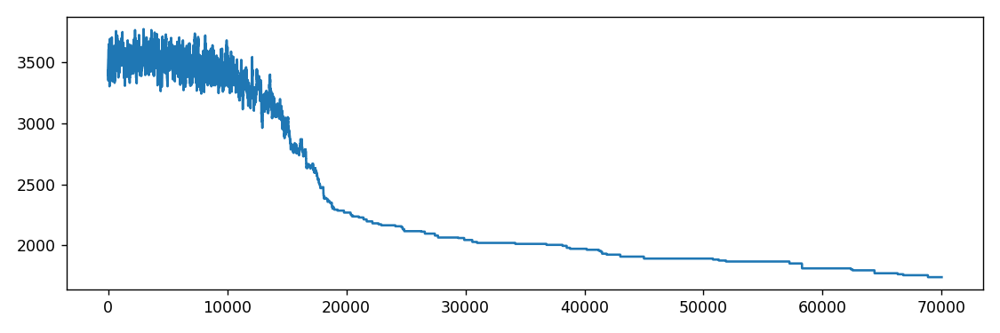

<IPython.core.display.Javascript object>


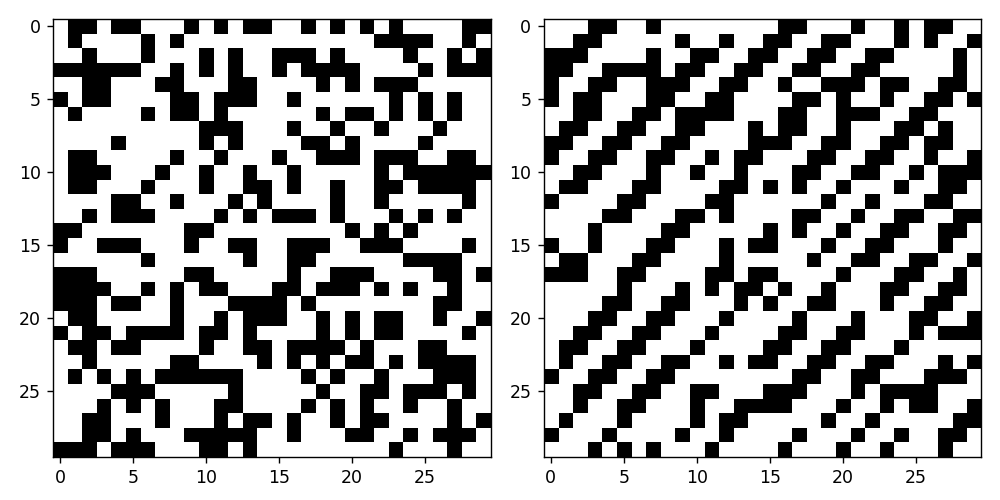

In [350]:
%matplotlib notebook
make(BI3, stairs_left_8, Basic_Temperature)

### Paski pionowo 4-sasiadow

<IPython.core.display.Javascript object>


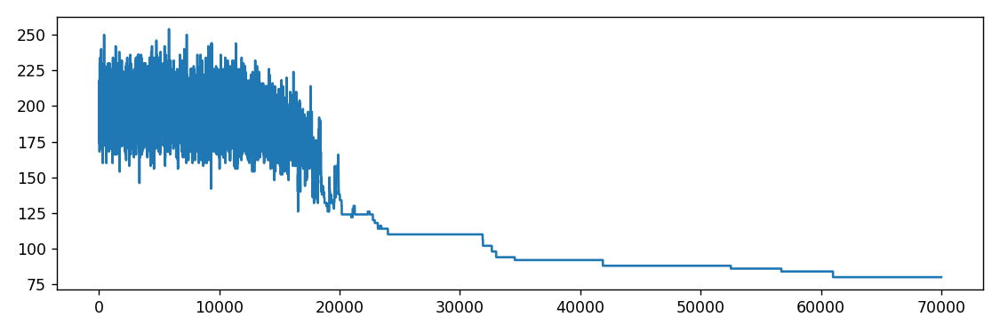

<IPython.core.display.Javascript object>


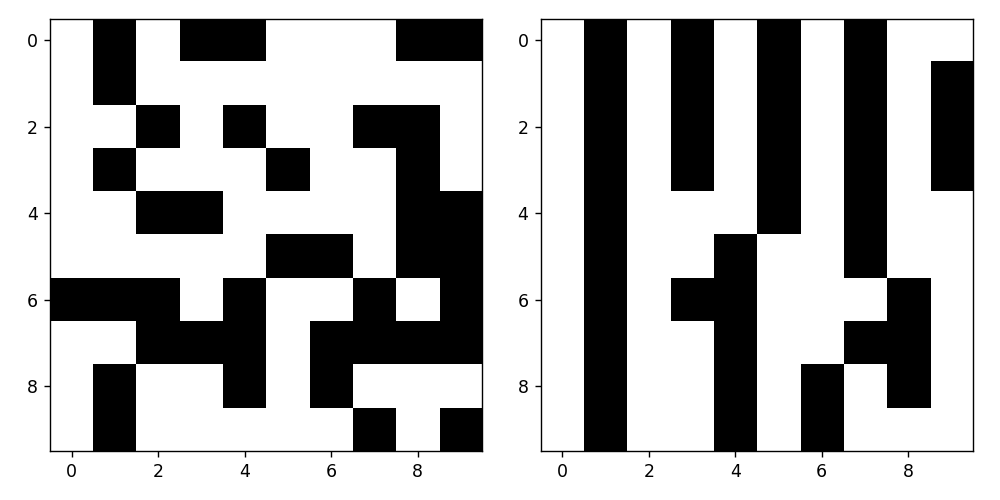

In [360]:
%matplotlib notebook
make(BI1, stripes_v_4, Basic_Temperature)

<IPython.core.display.Javascript object>


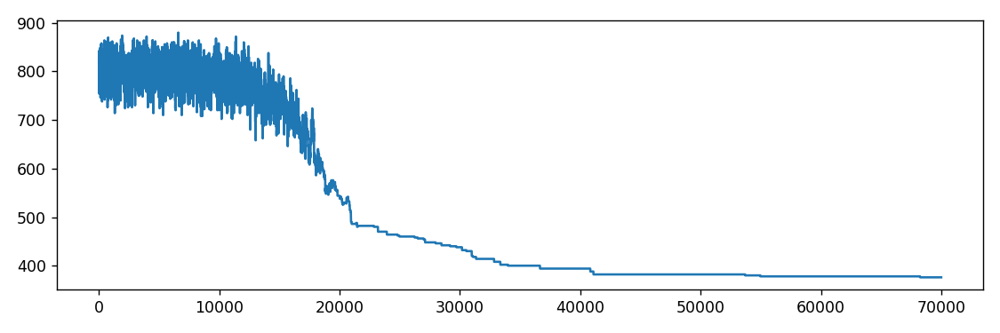

<IPython.core.display.Javascript object>


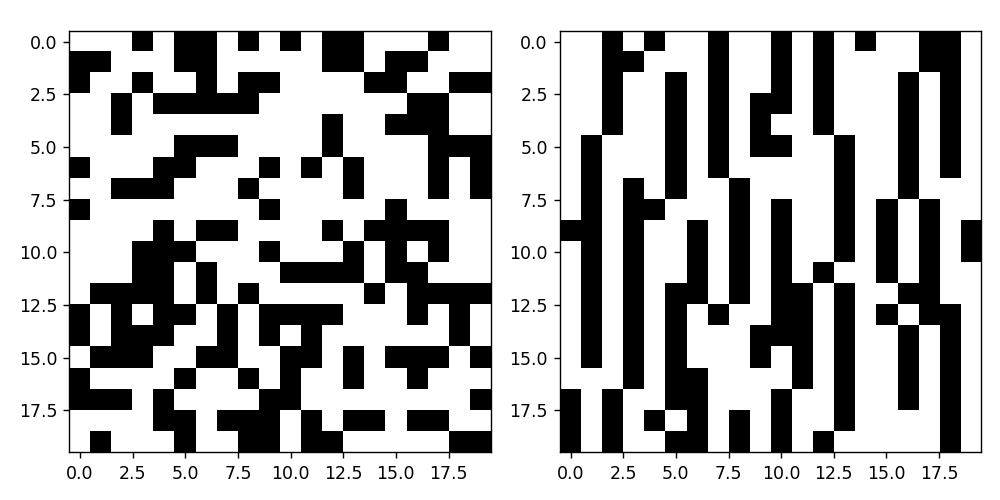

In [361]:
%matplotlib notebook
make(BI2, stripes_v_4, Basic_Temperature)

<IPython.core.display.Javascript object>


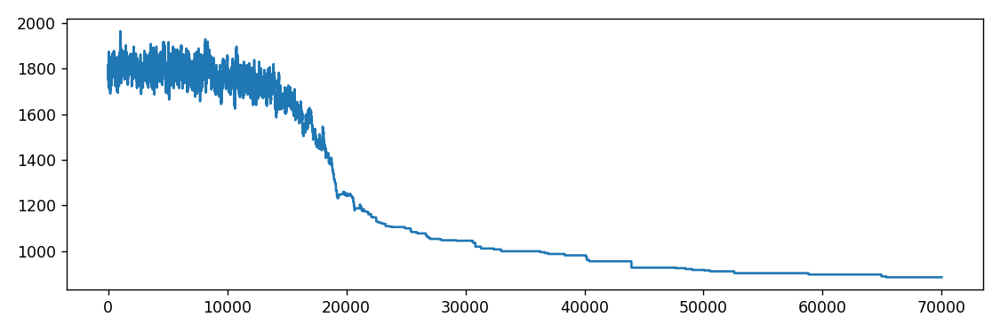

<IPython.core.display.Javascript object>


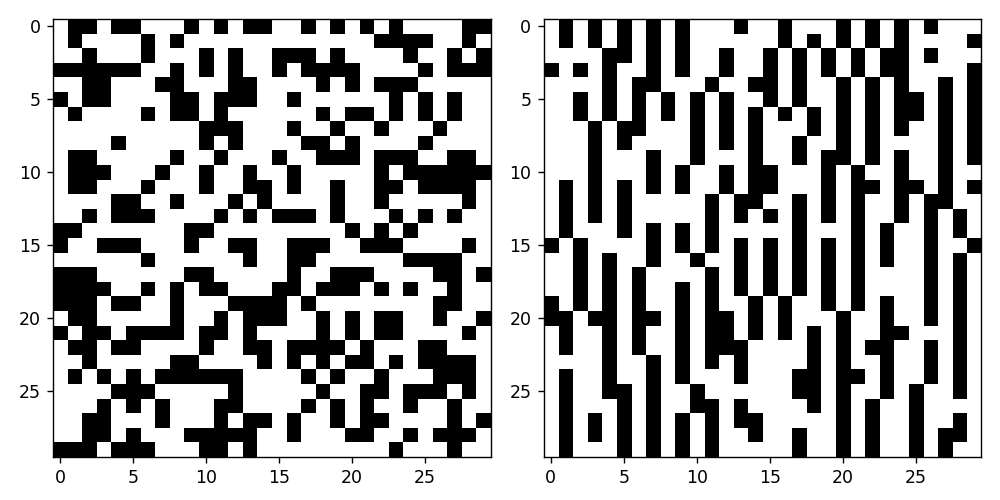

In [362]:
%matplotlib notebook
make(BI3, stripes_v_4, Basic_Temperature)

### Paski pionowo 8-sasiadow

<IPython.core.display.Javascript object>


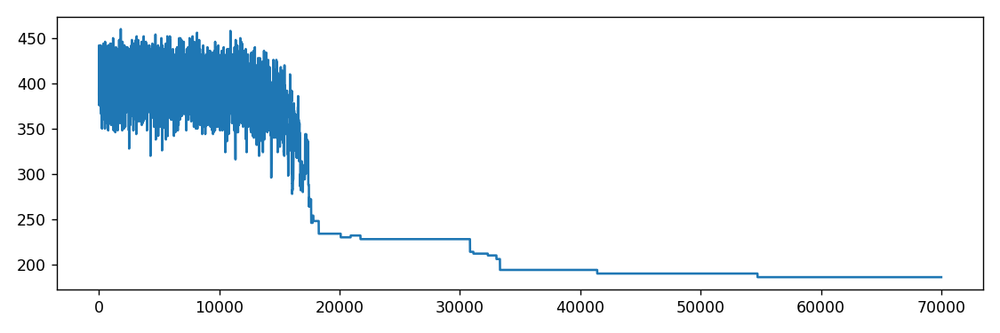

<IPython.core.display.Javascript object>


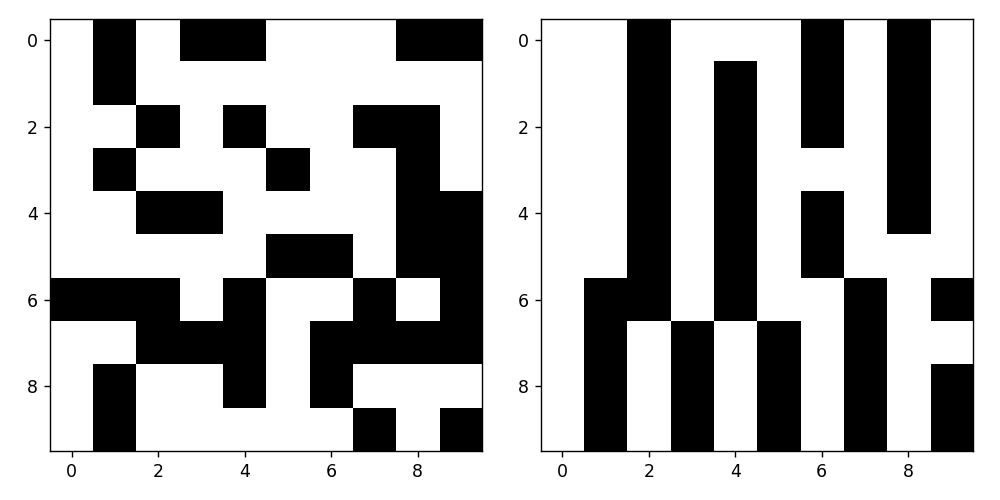

In [354]:
%matplotlib notebook
make(BI1, stripes_v_8, Basic_Temperature)

<IPython.core.display.Javascript object>


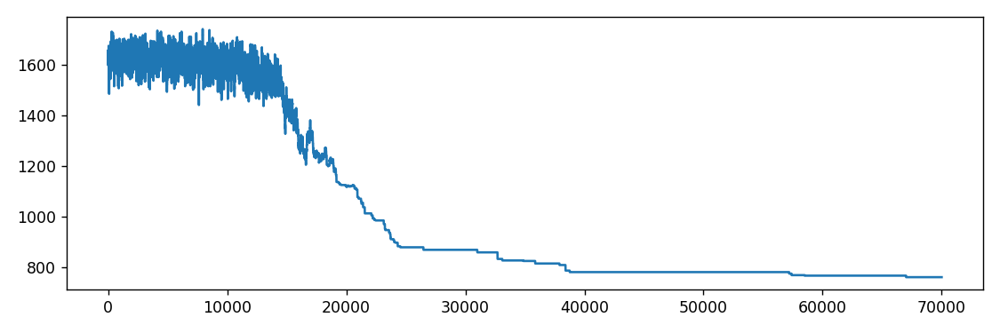

<IPython.core.display.Javascript object>


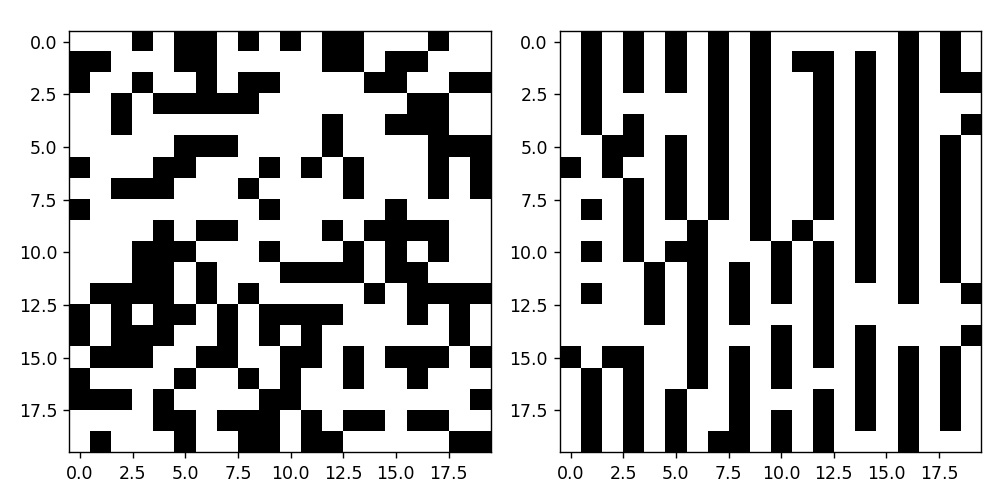

In [355]:
%matplotlib notebook
make(BI2, stripes_v_8, Basic_Temperature)

<IPython.core.display.Javascript object>


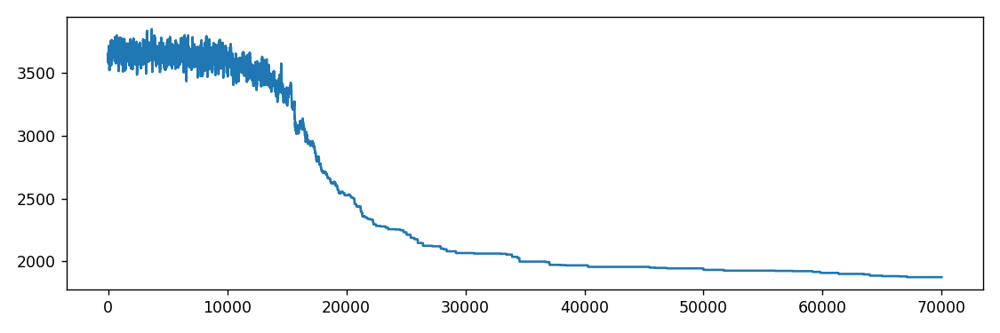

<IPython.core.display.Javascript object>


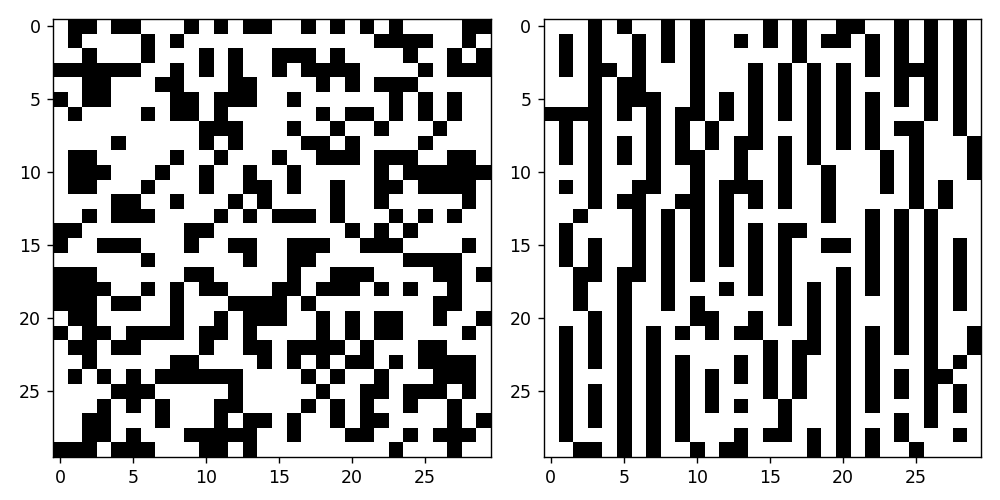

In [372]:
%matplotlib notebook
make(BI3, stripes_v_8, Basic_Temperature)

### Paski poziomo 4-sasiadow

<IPython.core.display.Javascript object>


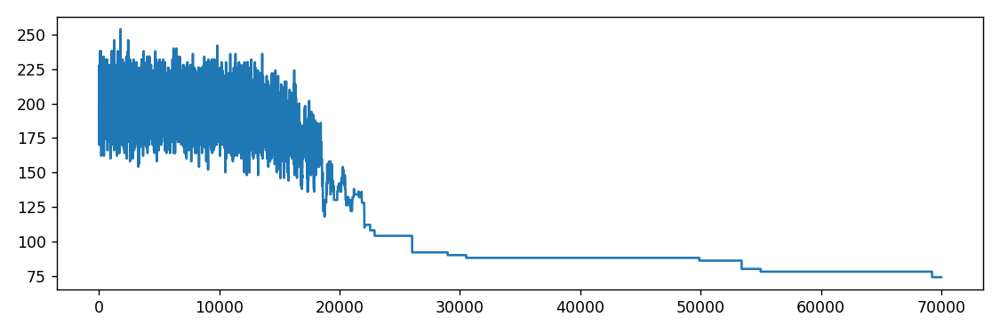

<IPython.core.display.Javascript object>


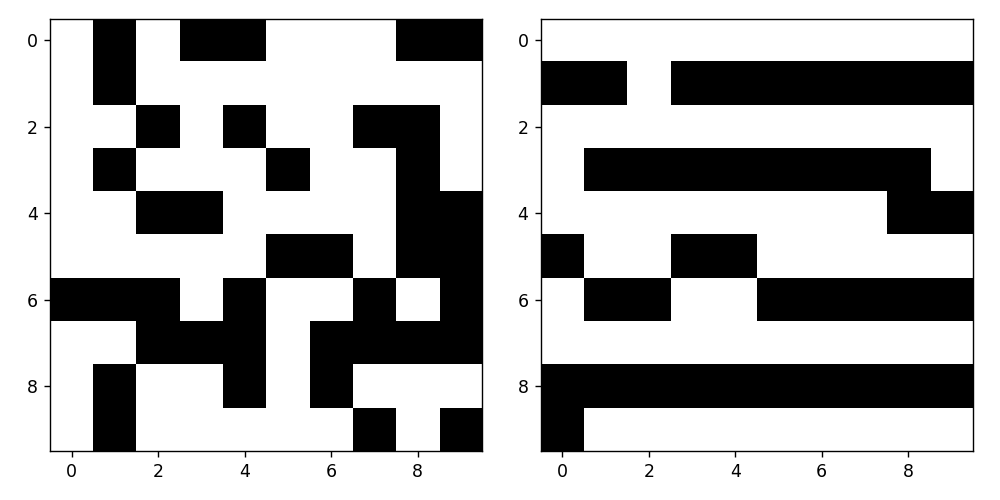

In [364]:
%matplotlib notebook
make(BI1, stripes_h_4, Basic_Temperature)

<IPython.core.display.Javascript object>


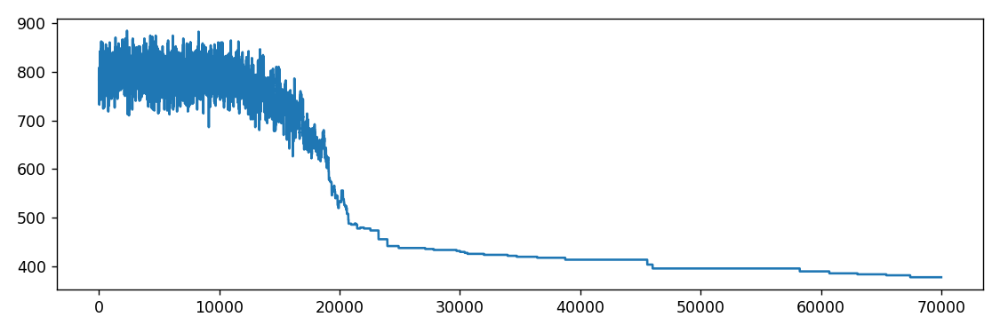

<IPython.core.display.Javascript object>


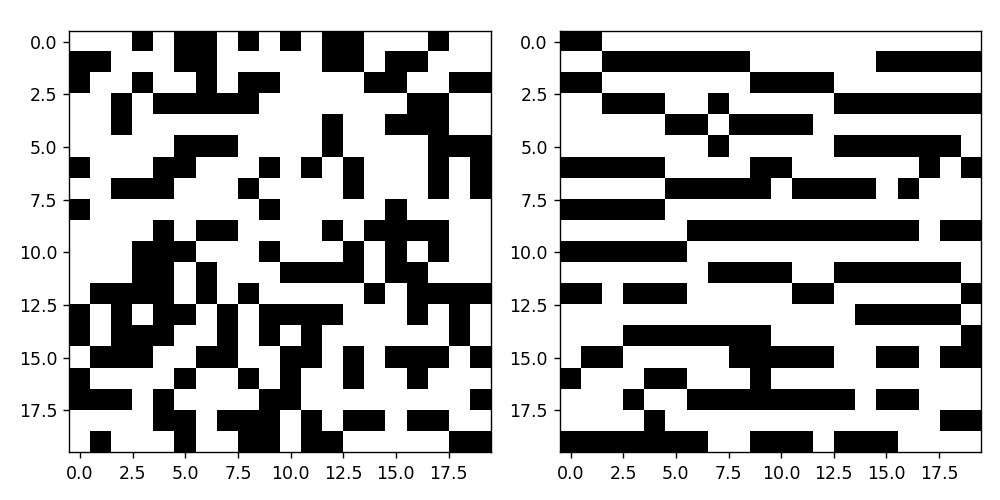

In [365]:
%matplotlib notebook
make(BI2, stripes_h_4, Basic_Temperature)

<IPython.core.display.Javascript object>


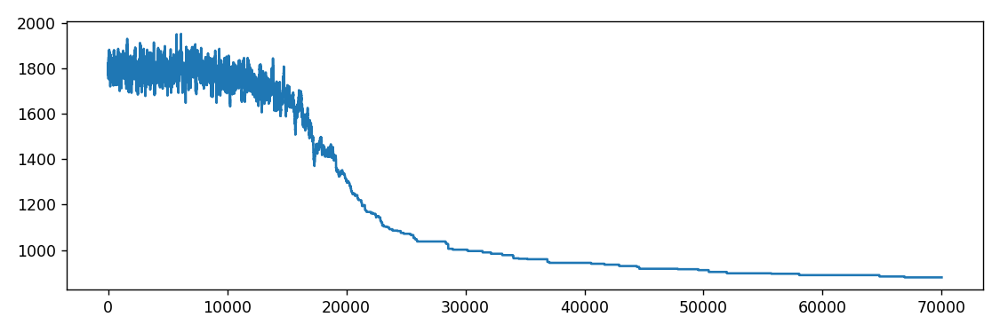

<IPython.core.display.Javascript object>


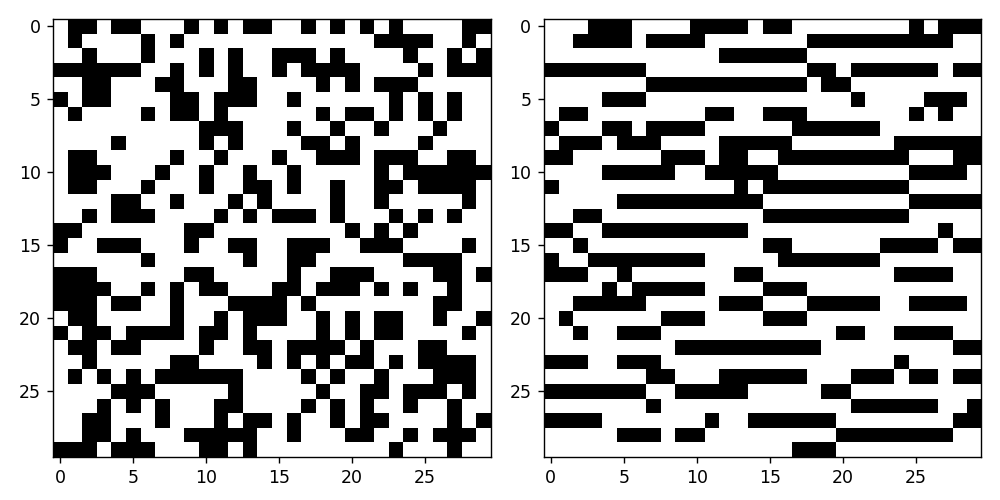

In [373]:
%matplotlib notebook
make(BI3, stripes_h_4, Basic_Temperature)

### Paski poziomo 8-sasiadow

<IPython.core.display.Javascript object>


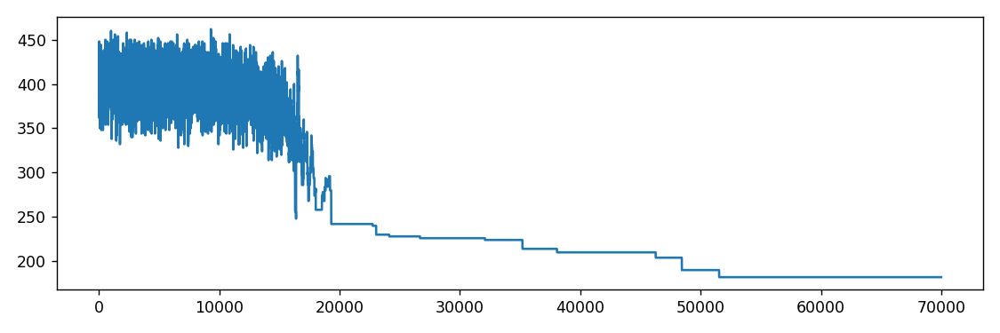

<IPython.core.display.Javascript object>


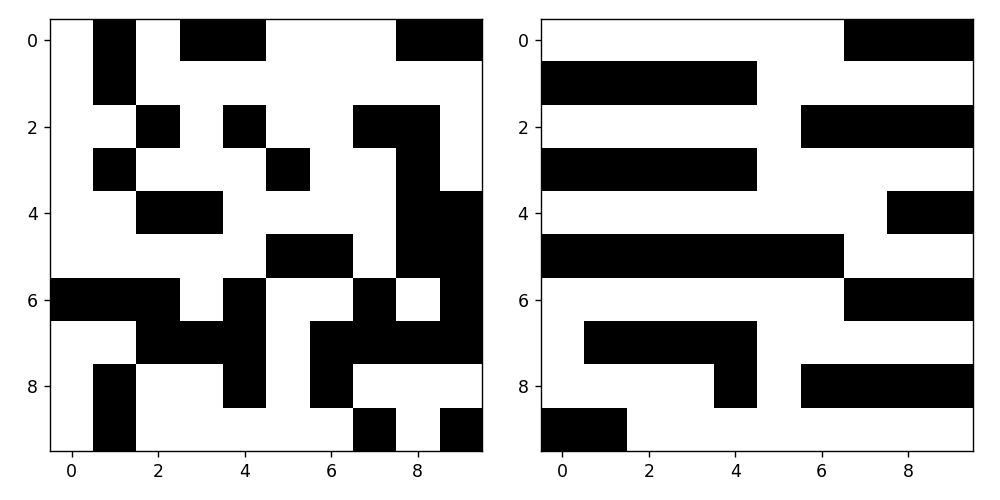

In [371]:
%matplotlib notebook
make(BI1, stripes_h_8, Basic_Temperature)

<IPython.core.display.Javascript object>


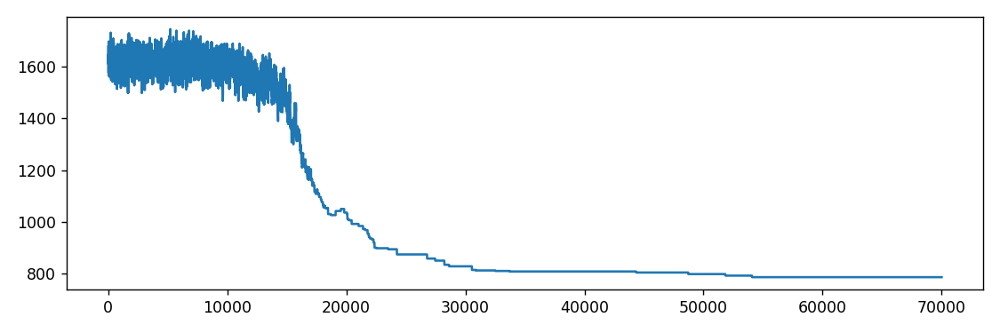

<IPython.core.display.Javascript object>


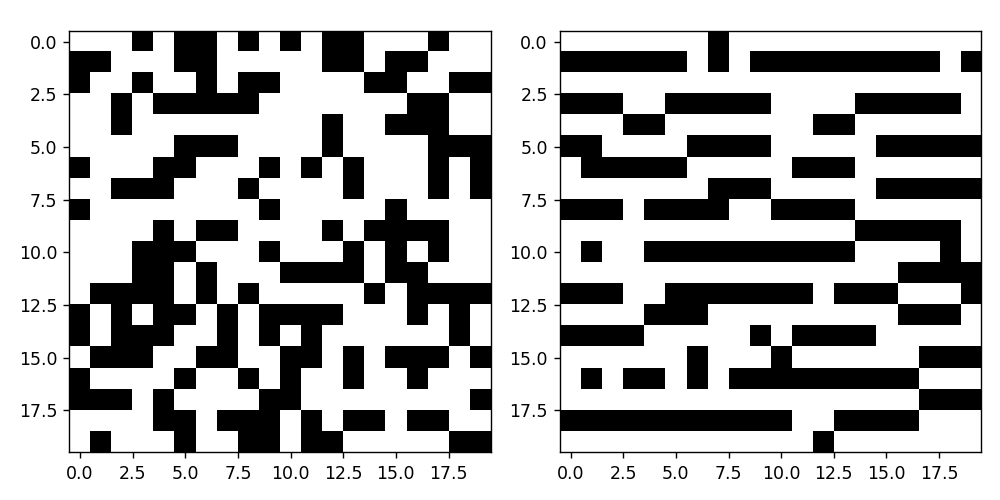

In [374]:
%matplotlib notebook
make(BI2, stripes_h_8, Basic_Temperature)

<IPython.core.display.Javascript object>


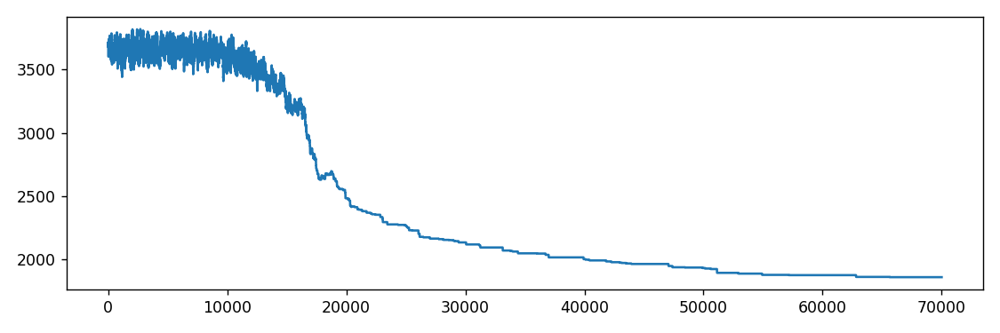

<IPython.core.display.Javascript object>


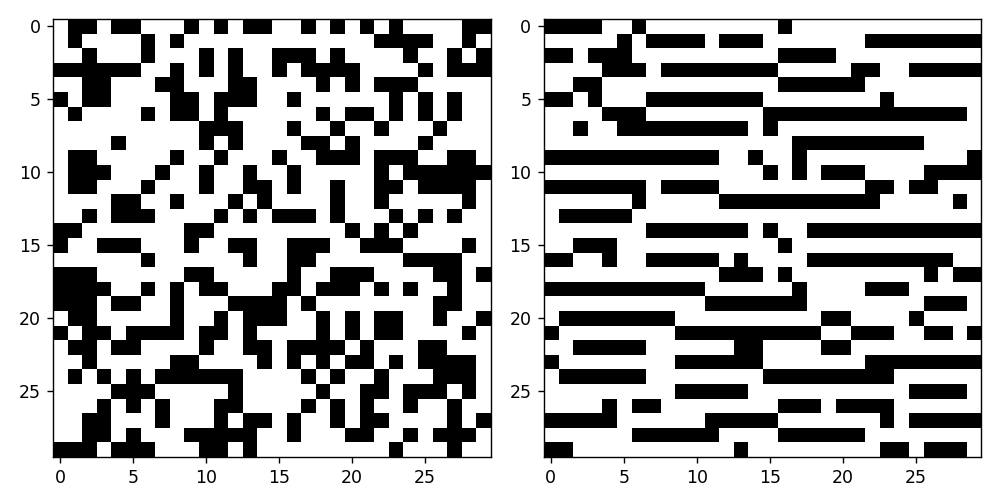

In [375]:
%matplotlib notebook
make(BI3, stripes_h_8, Basic_Temperature)

### Porównanie wyników dla różnej szybkości spadku temperatury

In [28]:
BI4 = BinaryImage(20, 0.4)

In [58]:
T1 = Temperature(500, 0.01,  1000, 0.9993)
T2 = Temperature(500, 0.03,  1000, 0.9994)
T3 = Temperature(500, 0.05,  1000, 0.9995)
T4 = Temperature(500, 0.075, 1000, 0.9996) 
T5 = Temperature(500, 0.1,   1000, 0.9997) 
T1_exp = T1.exponential
T1_lin = T1.linear
T2_exp = T2.exponential
T2_lin = T2.linear
T3_exp = T3.exponential
T3_lin = T3.linear
T4_exp = T4.exponential
T4_lin = T4.linear
T5_exp = T5.exponential
T5_lin = T5.linear

## FUNCKJA WYKLADNICZA ze startowa tempertaura 1000

##  q = 0.9993

<IPython.core.display.Javascript object>


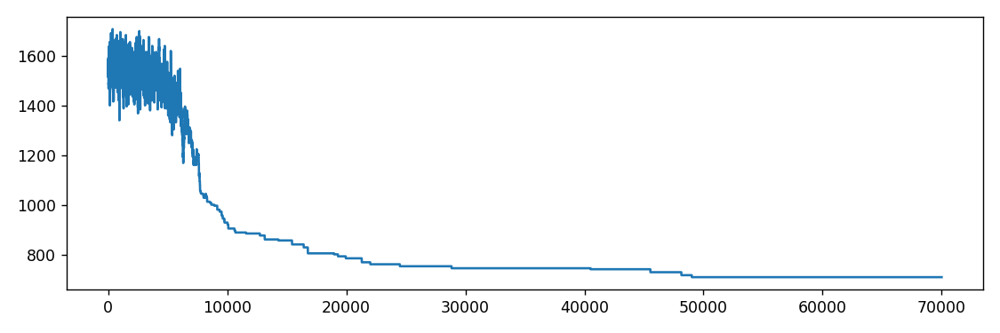

<IPython.core.display.Javascript object>


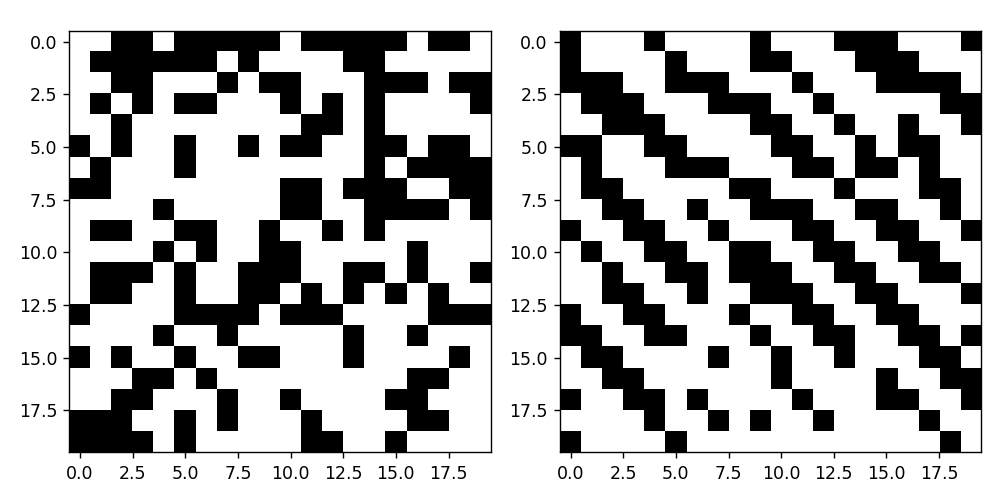

709.0


In [41]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T1_exp)
print(result)

## q = 0.9994

<IPython.core.display.Javascript object>


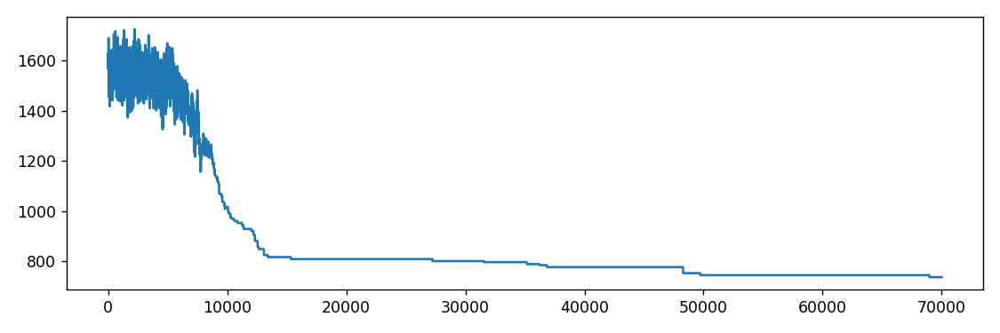

<IPython.core.display.Javascript object>


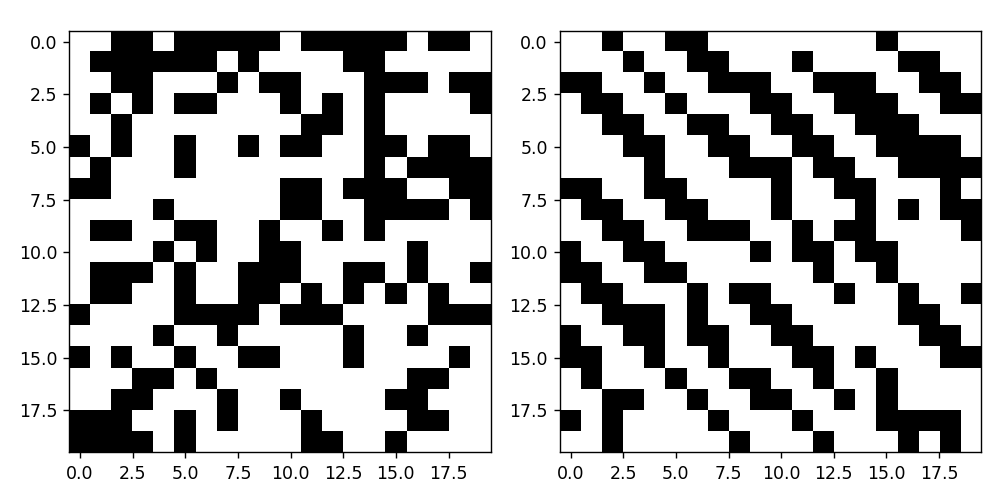

737.0


In [59]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T2_exp)
print(result)

## q = 0.9995

<IPython.core.display.Javascript object>


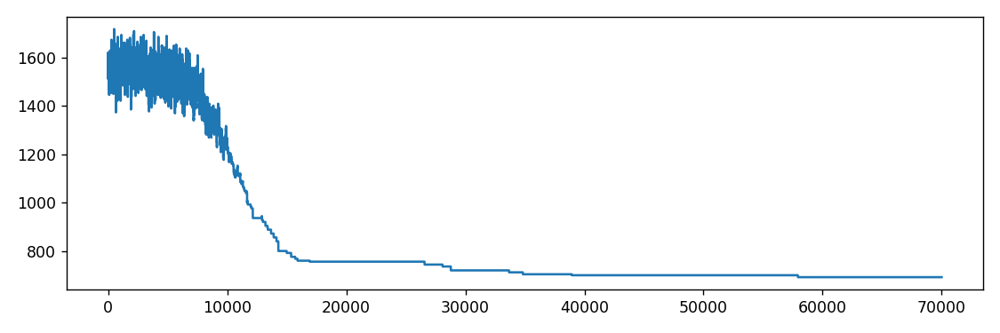

<IPython.core.display.Javascript object>


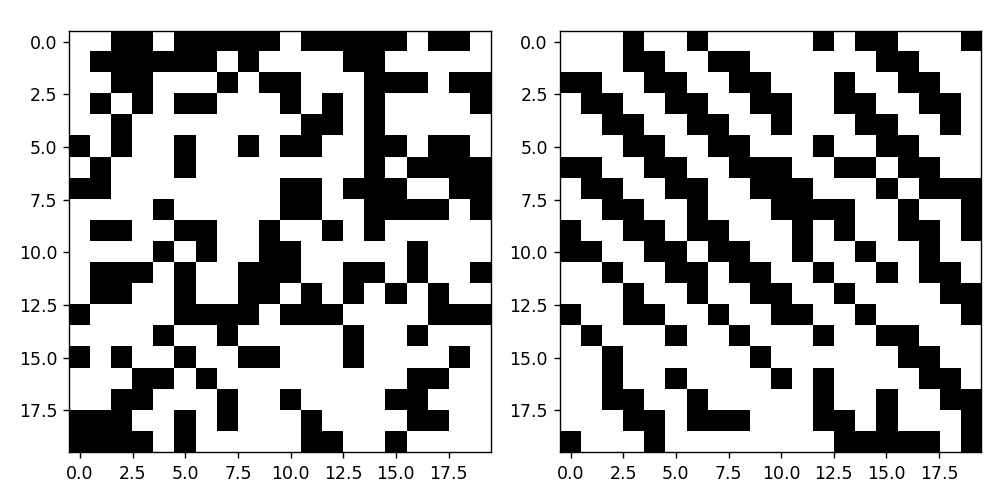

693.0


In [36]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T3_exp)
print(result)

## q = 0.9996

<IPython.core.display.Javascript object>


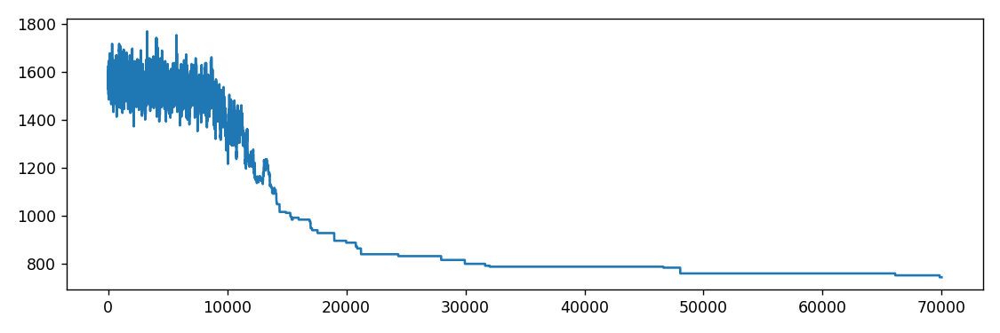

<IPython.core.display.Javascript object>


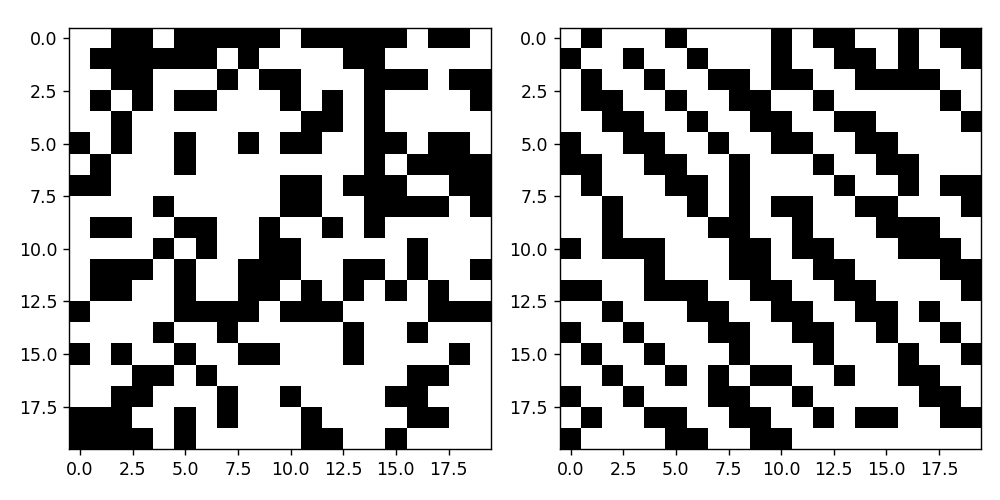

745.0


In [61]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T4_exp)
print(result)

## q = 0.9997

<IPython.core.display.Javascript object>


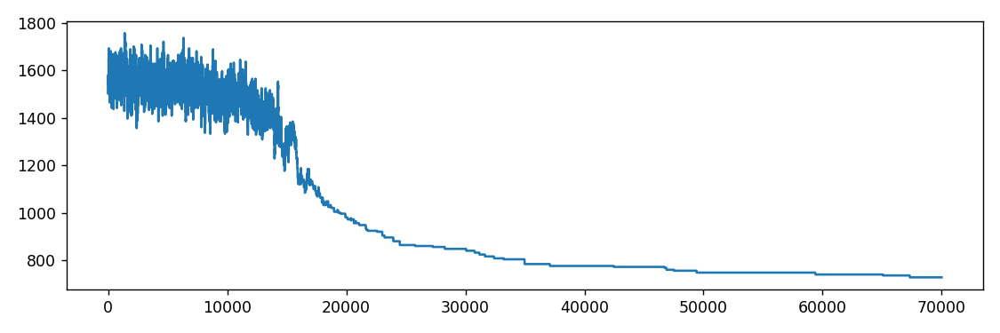

<IPython.core.display.Javascript object>


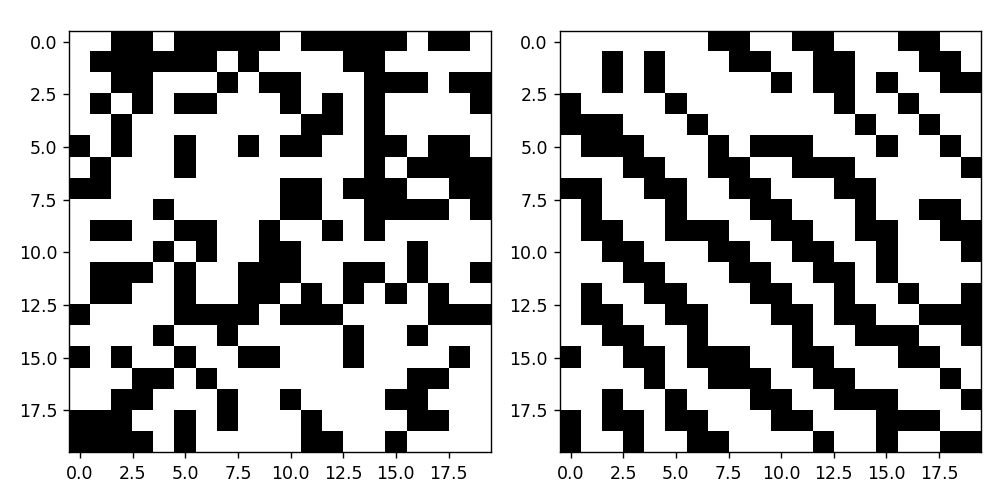

729.0


In [37]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T5_exp)
print(result)

## FUNKCJA LINIOWA ze startowa temperatura 500

## q = 0.01

<IPython.core.display.Javascript object>


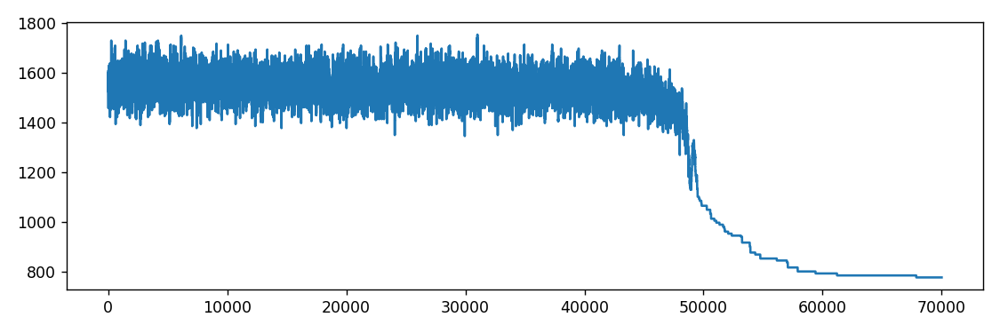

<IPython.core.display.Javascript object>


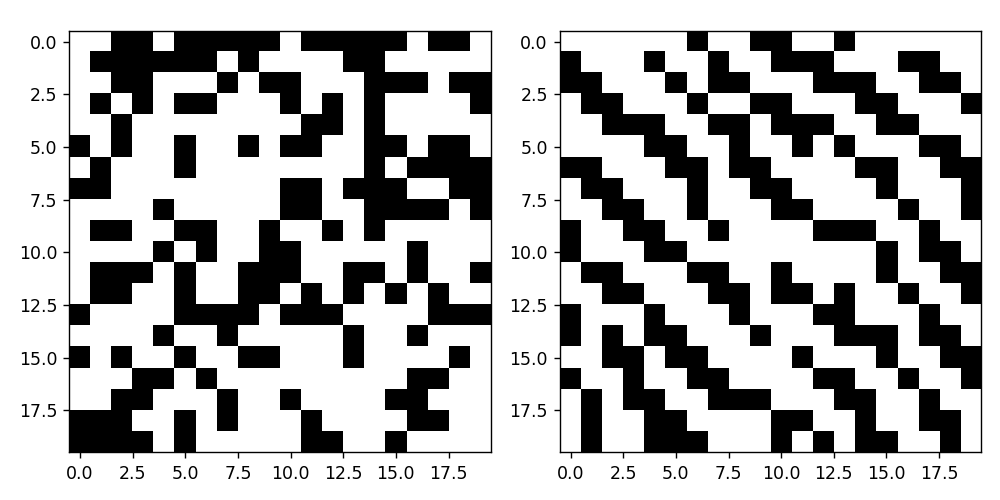

777.0


In [51]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T1_lin)
print(result)

## q = 0.03

<IPython.core.display.Javascript object>


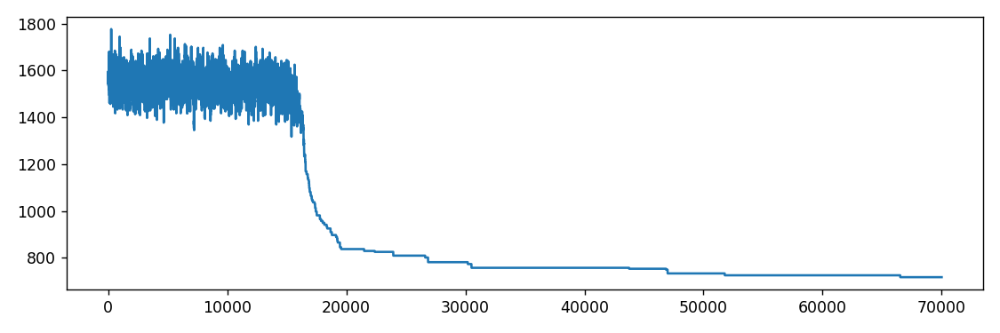

<IPython.core.display.Javascript object>


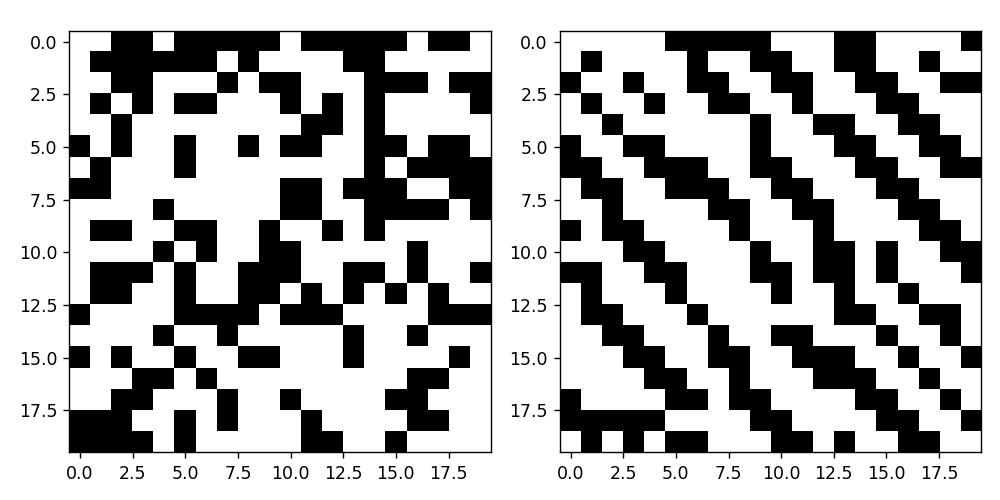

717.0


In [56]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T2_lin)
print(result)

## q = 0.05

<IPython.core.display.Javascript object>


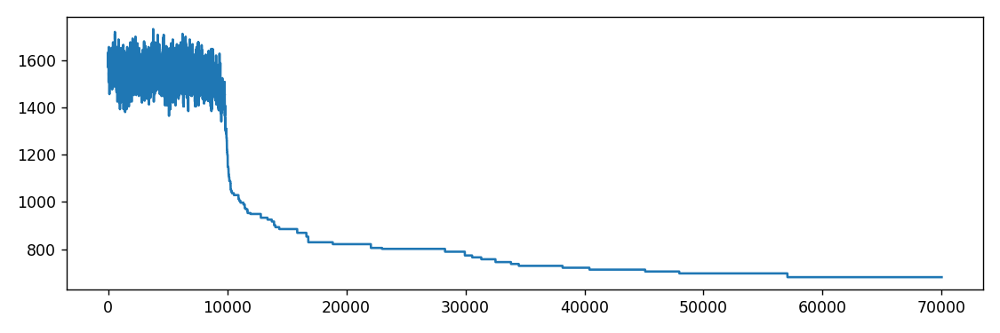

<IPython.core.display.Javascript object>


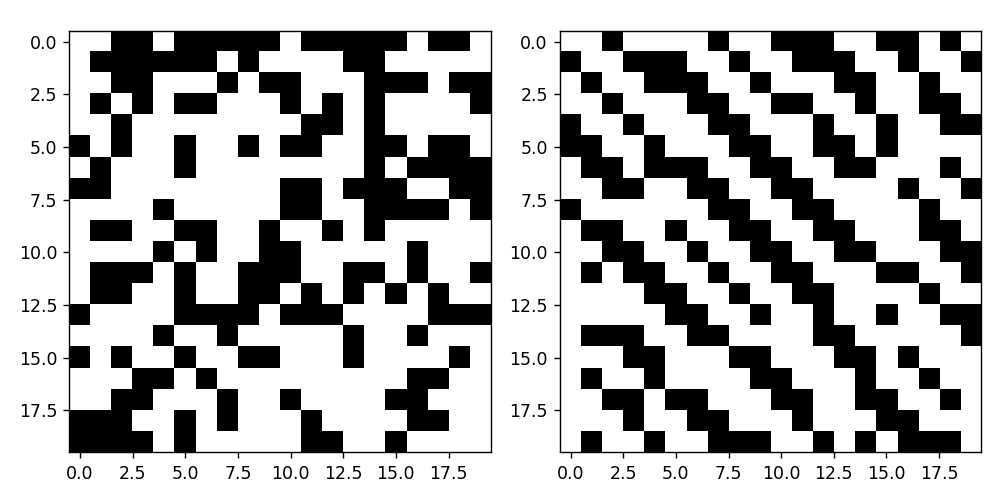

681.0


In [54]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T3_lin)
print(result)

## q = 0.075

<IPython.core.display.Javascript object>


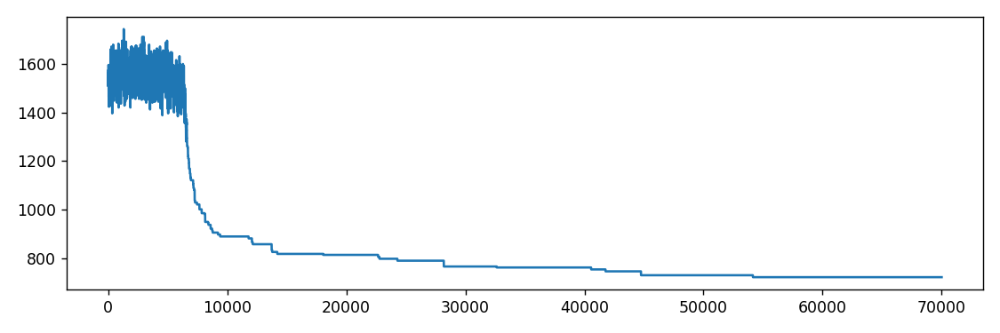

<IPython.core.display.Javascript object>


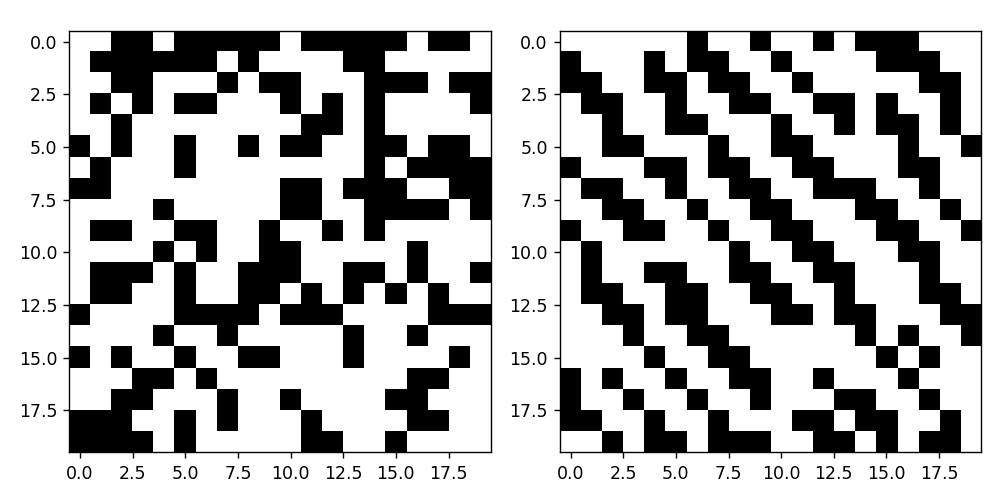

721.0


In [57]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T4_lin)
print(result)

## q = 0.1

<IPython.core.display.Javascript object>


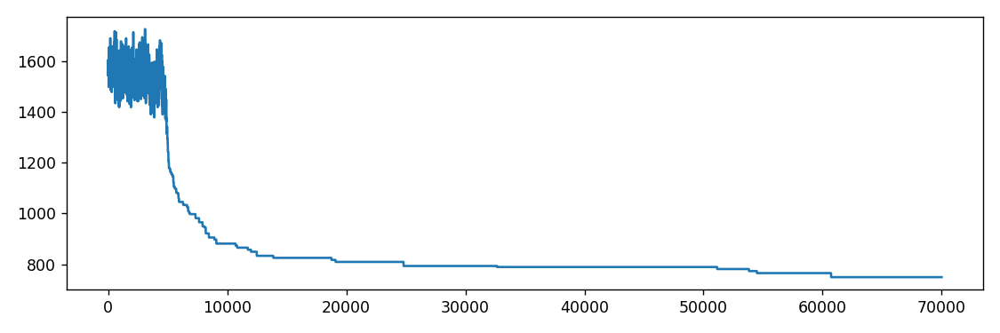

<IPython.core.display.Javascript object>


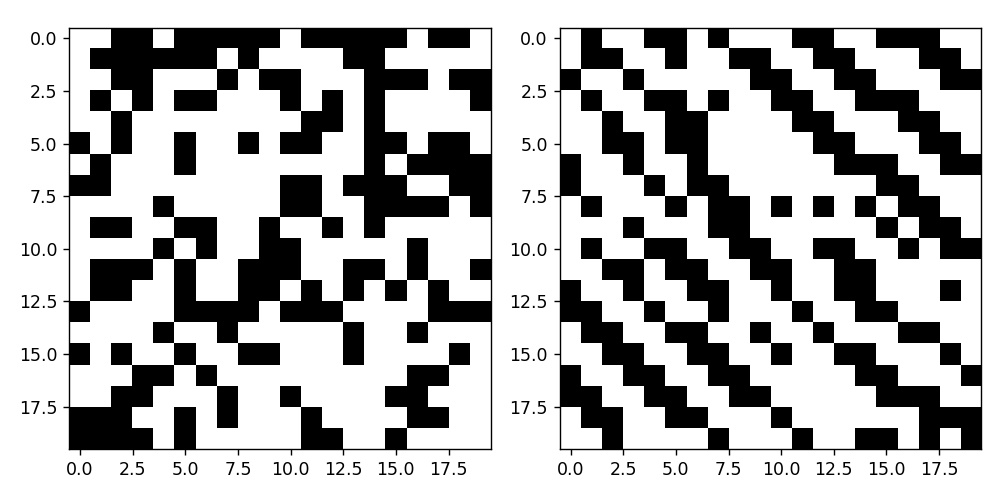

749.0


In [52]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T5_lin)
print(result)

## Najlepsze wyniki dla funkcji:

* wykładniczej dla temperatury 1000

## q = 0.9995

<IPython.core.display.Javascript object>


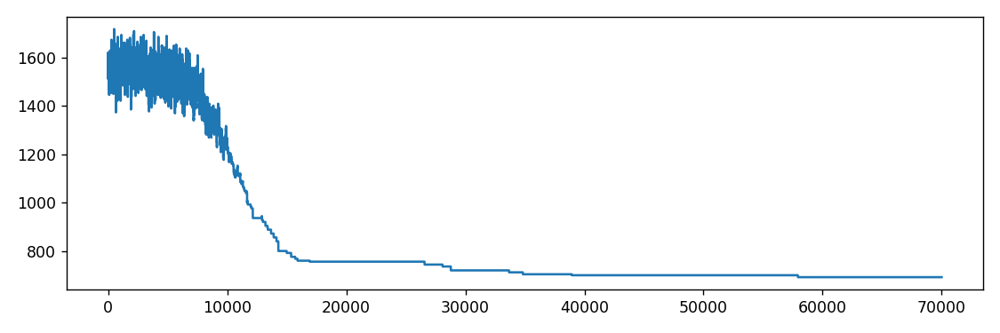

<IPython.core.display.Javascript object>


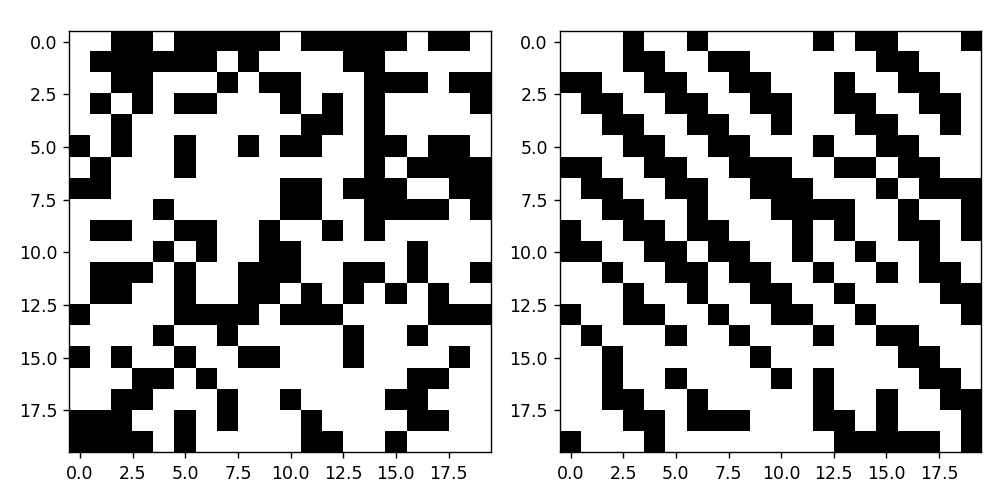

693.0


In [36]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T3_exp)
print(result)

* liniowej dla temperatury startowej 500

## q = 0.05

<IPython.core.display.Javascript object>


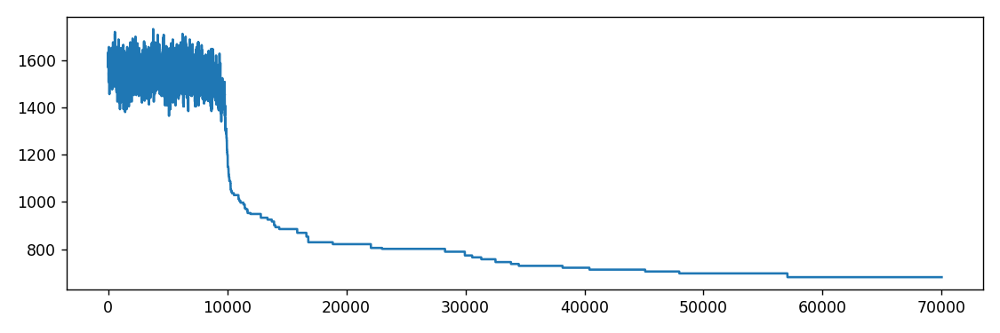

<IPython.core.display.Javascript object>


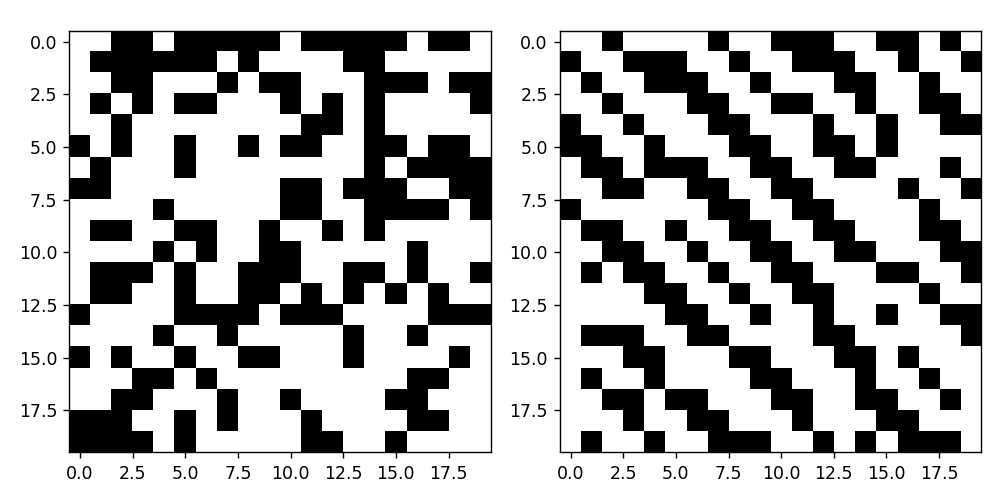

681.0


In [54]:
%matplotlib notebook
result = make(BI4, stairs_right_8, T3_lin)
print(result)

### WNIOSKI I OBSERWACJE:

* Dla stałej temperatury początkowej, aby zoptymalizować wynik działania algorytmu symulowanego wyżarzania, szybkość spadku temperatury nie może być ani za szybka ani za wolna, jak pokazują powyższe przykłady, istnieje optymalna szybkość spadku przy której przyspieszenie jak i zwolnienie spadku spowoduje spadek jakości
* Dla tych samych sposobów wyliczania energii, większa liczba sąsiadów powodowała polepszenie wyników kosztem spowolnienia algorytmu
* Z ostatnich dwóch wykresów przypuszczam, iż aby otrzymać najlepsze rezultaty, czas w którym temperatura jest wysoka powinien być stosunkowo niski w porównaniu do czasu wygaszania. Jest to zrozumiałe zjawisko ponieważ algorytm potrzebuje czasu, aby upewnić się, że nie jest w stanie polepszyć dalej rezultatów
* W wielu przypadkach energia spada stosunkowo szybko w początkowej części wykresów, tzn. zaraz po tym jak temperatura osiągnie wystarczająco małe wartości, jednak aby osiągnąć rezultat jeszcze lepszy warto dodać jeszcze sporo więcej kroków, jako iż algorytm przez długi czas (będąc na bardzo niskiej temperaturze) jest w stanie znajdować coraz lepsze rozwiązania